# Vision Transformer Frequency Analysis
## Replicating 'What do Deep Networks Like to See?' using FFT

**Approach:** Input Image → FFT → Learnable Frequency Mask → IFFT → Frozen Classifier

---

## Section 1: Setup & Environment Check

### 1.1 GPU Check

In [1]:
# Check GPU availability
!nvidia-smi

Fri Dec 19 14:22:52 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.163.01             Driver Version: 550.163.01     CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1060 6GB    Off |   00000000:01:00.0  On |                  N/A |
| 25%   37C    P2             27W /  120W |    3764MiB /   6144MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

### 1.2 Install Dependencies

In [3]:
# Install required packages
!pip install torch torchvision timm matplotlib numpy pillow -q

In [2]:
  # Restart kernel first (Kernel -> Restart)
  import sys
  print(sys.path)  # Check what's in your path
  import torch
  print(torch.__file__)  # Should show pixi environment path
  import torchvision
  print(torchvision.__file__)  # Should show pixi environment path

['/home/bab61wot/VIT/SIM2REAL/.pixi/envs/default/lib/python312.zip', '/home/bab61wot/VIT/SIM2REAL/.pixi/envs/default/lib/python3.12', '/home/bab61wot/VIT/SIM2REAL/.pixi/envs/default/lib/python3.12/lib-dynload', '', '/home/bab61wot/VIT/SIM2REAL/.pixi/envs/default/lib/python3.12/site-packages']
/home/bab61wot/VIT/SIM2REAL/.pixi/envs/default/lib/python3.12/site-packages/torch/__init__.py
/home/bab61wot/VIT/SIM2REAL/.pixi/envs/default/lib/python3.12/site-packages/torchvision/__init__.py


### 1.3 Import Libraries

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader

import timm
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import os
import sys
from tqdm import tqdm

print("All libraries imported successfully!")

All libraries imported successfully!


### 1.4 Verify PyTorch GPU Access

In [4]:
# Check CUDA availability and device info
print(f"PyTorch Version: {torch.__version__}")
print(f"CUDA Available: {torch.cuda.is_available()}")

if torch.cuda.is_available():
    print(f"CUDA Version: {torch.version.cuda}")
    print(f"GPU Device: {torch.cuda.get_device_name(0)}")
    print(f"Number of GPUs: {torch.cuda.device_count()}")
    device = torch.device('cuda')
    print(f"\n✓ Using device: {device}")

    # Test GPU with a simple tensor operation
    test_tensor = torch.randn(1000, 1000).to(device)
    result = torch.matmul(test_tensor, test_tensor)
    print(f"✓ GPU test passed - tensor shape: {result.shape}")
else:
    device = torch.device('cpu')
    print(f"\n⚠ WARNING: CUDA not available. Using CPU.")
    print("Please enable GPU in Colab: Runtime → Change runtime type → GPU")

PyTorch Version: 2.7.1+cu118
CUDA Available: True
CUDA Version: 11.8
GPU Device: NVIDIA GeForce GTX 1060 6GB
Number of GPUs: 1

✓ Using device: cuda
✓ GPU test passed - tensor shape: torch.Size([1000, 1000])


In [13]:
from huggingface_hub import login
login()

### 1.5 Load ImageNet Validation Dataset

In [6]:
                                                                                                                                                                                                         
  from datasets import load_dataset, Dataset, concatenate_datasets, load_from_disk                                                                                                                        
  from torch.utils.data import DataLoader                                                                                                                                                                 
  from torchvision import transforms                                                                                                                                                                      
  import torch                                                                                                                                                                                            
  import os                                                                                                                                                                                               
  import gc                                                                                                                                                                                               
  import sys                                                                                                                                                                                              
                                                                                                                                                                                                          
  # Auto-detect project root (works anywhere!)                                                                                                                                                            
  PROJECT_ROOT = os.getcwd()  # Gets current directory                                                                                                                                                    
  if PROJECT_ROOT not in sys.path:                                                                                                                                                                        
      sys.path.insert(0, PROJECT_ROOT)                                                                                                                                                                    
  print(f"Project root: {PROJECT_ROOT}")                                                                                                                                                                  
                                                                                                                                                                                                          
  # Import your existing dataset wrapper                                                                                                                                                                  
  from data.dataset import HFImageNetDataset                                                                                                                                                              
                                                                                                                                                                                                          
  # Configuration                                                                                                                                                                                         
  TOTAL_IMAGES = 25000                                                                                                                                                                                    
  BATCH_SIZE = 100  # Download only 100 at a time (safe!)                                                                                                                                                 
  CACHE_PATH = os.path.join(PROJECT_ROOT, "data", "imagenet_25k_cache")                                                                                                                                   
  TEMP_DIR = os.path.join(PROJECT_ROOT, "data", "temp_batches")                                                                                                                                           
                                                                                                                                                                                                          
  print("=" * 60)                                                                                                                                                                                         
  print(f"ImageNet {TOTAL_IMAGES} Image Download (Ultra-Safe Mode)")                                                                                                                                      
  print("=" * 60)                                                                                                                                                                                         
  print(f"Strategy: Download {BATCH_SIZE} images at a time, save immediately")                                                                                                                            
  print(f"Peak memory usage: <500MB")                                                                                                                                                                     
  print(f"Cache location: {CACHE_PATH}")                                                                                                                                                                  
  print("=" * 60)                                                                                                                                                                                         
                                                                                                                                                                                                          
  # Check if final cache exists                                                                                                                                                                           
  if os.path.exists(CACHE_PATH):                                                                                                                                                                          
      print(f"\n✓ Found existing cache at {CACHE_PATH}")                                                                                                                                                  
      print("Loading from cache...")                                                                                                                                                                      
      imagenet_subset = load_from_disk(CACHE_PATH)                                                                                                                                                        
      print(f"✓ Loaded {len(imagenet_subset):,} images")                                                                                                                                                  
                                                                                                                                                                                                          
  else:                                                                                                                                                                                                   
      print(f"\n⚠ No cache found. Starting fresh download...")                                                                                                                                            
                                                                                                                                                                                                          
      # Create temp directory for batches                                                                                                                                                                 
      os.makedirs(TEMP_DIR, exist_ok=True)                                                                                                                                                                
                                                                                                                                                                                                          
      # Calculate number of batches                                                                                                                                                                       
      num_batches = (TOTAL_IMAGES + BATCH_SIZE - 1) // BATCH_SIZE                                                                                                                                         
      print(f"\nWill download in {num_batches} batches of {BATCH_SIZE} images each")                                                                                                                      
                                                                                                                                                                                                          
      # Start streaming dataset                                                                                                                                                                           
      print("\nConnecting to ImageNet...")                                                                                                                                                                
      streaming_ds = load_dataset(                                                                                                                                                                        
          "ILSVRC/imagenet-1k",                                                                                                                                                                           
          split="validation",                                                                                                                                                                             
          streaming=True                                                                                                                                                                                  
      )                                                                                                                                                                                                   
                                                                                                                                                                                                          
      # Download in batches                                                                                                                                                                               
      all_batches = []                                                                                                                                                                                    
      current_batch_data = {'image': [], 'label': []}                                                                                                                                                     
      total_downloaded = 0                                                                                                                                                                                
      batch_num = 0                                                                                                                                                                                       
                                                                                                                                                                                                          
      print("\nStarting download...\n")                                                                                                                                                                   
                                                                                                                                                                                                          
      for i, sample in enumerate(streaming_ds):                                                                                                                                                           
          # Add sample to current batch                                                                                                                                                                   
          current_batch_data['image'].append(sample['image'])                                                                                                                                             
          current_batch_data['label'].append(sample['label'])                                                                                                                                             
          total_downloaded += 1                                                                                                                                                                           
                                                                                                                                                                                                          
          # When batch is full OR we've hit our total, save it                                                                                                                                            
          if len(current_batch_data['image']) >= BATCH_SIZE or total_downloaded >= TOTAL_IMAGES:                                                                                                          
              batch_num += 1                                                                                                                                                                              
                                                                                                                                                                                                          
              # Convert batch to dataset                                                                                                                                                                  
              batch_dataset = Dataset.from_dict(current_batch_data)                                                                                                                                       
                                                                                                                                                                                                          
              # Save batch to disk                                                                                                                                                                        
              batch_path = os.path.join(TEMP_DIR, f"batch_{batch_num:03d}")                                                                                                                               
              batch_dataset.save_to_disk(batch_path)                                                                                                                                                      
                                                                                                                                                                                                          
              print(f"✓ Batch {batch_num}/{num_batches} saved: {len(batch_dataset)} images (Total: {total_downloaded}/{TOTAL_IMAGES})")                                                                   
                                                                                                                                                                                                          
              # Clear memory explicitly                                                                                                                                                                   
              current_batch_data = {'image': [], 'label': []}                                                                                                                                             
              del batch_dataset                                                                                                                                                                           
              gc.collect()  # Force garbage collection                                                                                                                                                    
                                                                                                                                                                                                          
              # Stop if we've reached our target                                                                                                                                                          
              if total_downloaded >= TOTAL_IMAGES:                                                                                                                                                        
                  break                                                                                                                                                                                   
                                                                                                                                                                                                          
      print(f"\n✓ All {total_downloaded} images downloaded in {batch_num} batches")                                                                                                                       
                                                                                                                                                                                                          
      # Now combine all batches into one dataset                                                                                                                                                          
      print("\nCombining batches into final dataset...")                                                                                                                                                  
      batch_datasets = []                                                                                                                                                                                 
      for i in range(1, batch_num + 1):                                                                                                                                                                   
          batch_path = os.path.join(TEMP_DIR, f"batch_{i:03d}")                                                                                                                                           
          batch_ds = load_from_disk(batch_path)                                                                                                                                                           
          batch_datasets.append(batch_ds)                                                                                                                                                                 
          print(f"  Loaded batch {i}/{batch_num}")                                                                                                                                                        
                                                                                                                                                                                                          
      # Concatenate all batches                                                                                                                                                                           
      print("\nMerging batches...")                                                                                                                                                                       
      imagenet_subset = concatenate_datasets(batch_datasets)                                                                                                                                              
      print(f"✓ Combined dataset: {len(imagenet_subset)} images")                                                                                                                                         
                                                                                                                                                                                                          
      # Save final dataset                                                                                                                                                                                
      print(f"\nSaving final dataset to {CACHE_PATH}...")                                                                                                                                                 
      imagenet_subset.save_to_disk(CACHE_PATH)                                                                                                                                                            
      print("✓ Saved!")                                                                                                                                                                                   
                                                                                                                                                                                                          
      # Clean up temp batches                                                                                                                                                                             
      print("\nCleaning up temporary files...")                                                                                                                                                           
      import shutil                                                                                                                                                                                       
      shutil.rmtree(TEMP_DIR)                                                                                                                                                                             
      print("✓ Cleanup complete")                                                                                                                                                                         
                                                                                                                                                                                                          
      print("\n" + "=" * 60)                                                                                                                                                                              
      print("✅ Download complete! Future runs will load instantly.")                                                                                                                                     
      print("=" * 60)                                                                                                                                                                                     
                                                                                                                                                                                                          
  # Set up transforms                                                                                                                                                                                     
  print("\n[Transform] Setting up ImageNet normalization...")                                                                                                                                             
  transform = transforms.Compose([                                                                                                                                                                        
      transforms.Resize((224, 224)),                                                                                                                                                                      
      transforms.ToTensor(),                                                                                                                                                                              
      transforms.Normalize(                                                                                                                                                                               
          mean=[0.485, 0.456, 0.406],                                                                                                                                                                     
          std=[0.229, 0.224, 0.225]                                                                                                                                                                       
      )                                                                                                                                                                                                   
  ])                                                                                                                                                                                                      
                                                                                                                                                                                                          
  # Create PyTorch dataset and dataloader                                                                                                                                                                 
  print("\n[DataLoader] Creating PyTorch dataset...")                                                                                                                                                     
  dataset = HFImageNetDataset(imagenet_subset, transform=transform)                                                                                                                                       
                                                                                                                                                                                                          
  dataloader = DataLoader(                                                                                                                                                                                
      dataset,                                                                                                                                                                                            
      batch_size=64,                                                                                                                                                                                      
      shuffle=False,                                                                                                                                                                                      
      num_workers=2,                                                                                                                                                                                      
      pin_memory=True                                                                                                                                                                                     
  )                                                                                                                                                                                                       
                                                                                                                                                                                                          
  print("\n" + "=" * 60)                                                                                                                                                                                  
  print("✅ SUCCESS! Dataset ready")                                                                                                                                                                      
  print("=" * 60)                                                                                                                                                                                         
  print(f"Dataset size: {len(dataset):,} images")                                                                                                                                                         
  print(f"Batches: {len(dataloader):,} (batch_size=64)")                                                                                                                                                  
  print(f"Cache location: {CACHE_PATH}")                                                                                                                                                                  
  print("=" * 60)                                                                                                                                                                                         
                                                                                                                                                                                                          
  # Test first batch                                                                                                                                                                                      
  print("\n🔍 Testing first batch...")                                                                                                                                                                    
  first_batch = next(iter(dataloader))                                                                                                                                                                    
  images, labels = first_batch                                                                                                                                                                            
  print(f"✓ Batch shape: {images.shape}")                                                                                                                                                                 
  print(f"✓ Labels shape: {labels.shape}")                                                                                                                                                                
  print("\n🎉 Ready for experiments!")            




Project root: /home/bab61wot/VIT/SIM2REAL
ImageNet 25000 Image Download (Ultra-Safe Mode)
Strategy: Download 100 images at a time, save immediately
Peak memory usage: <500MB
Cache location: /home/bab61wot/VIT/SIM2REAL/data/imagenet_25k_cache

⚠ No cache found. Starting fresh download...

Will download in 250 batches of 100 images each

Connecting to ImageNet...


Resolving data files:   0%|          | 0/294 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/28 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/294 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/28 [00:00<?, ?it/s]


Starting download...



Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 1/250 saved: 100 images (Total: 100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 2/250 saved: 100 images (Total: 200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 3/250 saved: 100 images (Total: 300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 4/250 saved: 100 images (Total: 400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 5/250 saved: 100 images (Total: 500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 6/250 saved: 100 images (Total: 600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 7/250 saved: 100 images (Total: 700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 8/250 saved: 100 images (Total: 800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 9/250 saved: 100 images (Total: 900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 10/250 saved: 100 images (Total: 1000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 11/250 saved: 100 images (Total: 1100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 12/250 saved: 100 images (Total: 1200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 13/250 saved: 100 images (Total: 1300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 14/250 saved: 100 images (Total: 1400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 15/250 saved: 100 images (Total: 1500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 16/250 saved: 100 images (Total: 1600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 17/250 saved: 100 images (Total: 1700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 18/250 saved: 100 images (Total: 1800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 19/250 saved: 100 images (Total: 1900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 20/250 saved: 100 images (Total: 2000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 21/250 saved: 100 images (Total: 2100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 22/250 saved: 100 images (Total: 2200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 23/250 saved: 100 images (Total: 2300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 24/250 saved: 100 images (Total: 2400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 25/250 saved: 100 images (Total: 2500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 26/250 saved: 100 images (Total: 2600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 27/250 saved: 100 images (Total: 2700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 28/250 saved: 100 images (Total: 2800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 29/250 saved: 100 images (Total: 2900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 30/250 saved: 100 images (Total: 3000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 31/250 saved: 100 images (Total: 3100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 32/250 saved: 100 images (Total: 3200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 33/250 saved: 100 images (Total: 3300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 34/250 saved: 100 images (Total: 3400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 35/250 saved: 100 images (Total: 3500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 36/250 saved: 100 images (Total: 3600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 37/250 saved: 100 images (Total: 3700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 38/250 saved: 100 images (Total: 3800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 39/250 saved: 100 images (Total: 3900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 40/250 saved: 100 images (Total: 4000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 41/250 saved: 100 images (Total: 4100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 42/250 saved: 100 images (Total: 4200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 43/250 saved: 100 images (Total: 4300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 44/250 saved: 100 images (Total: 4400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 45/250 saved: 100 images (Total: 4500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 46/250 saved: 100 images (Total: 4600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 47/250 saved: 100 images (Total: 4700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 48/250 saved: 100 images (Total: 4800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 49/250 saved: 100 images (Total: 4900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 50/250 saved: 100 images (Total: 5000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 51/250 saved: 100 images (Total: 5100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 52/250 saved: 100 images (Total: 5200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 53/250 saved: 100 images (Total: 5300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 54/250 saved: 100 images (Total: 5400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 55/250 saved: 100 images (Total: 5500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 56/250 saved: 100 images (Total: 5600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 57/250 saved: 100 images (Total: 5700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 58/250 saved: 100 images (Total: 5800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 59/250 saved: 100 images (Total: 5900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 60/250 saved: 100 images (Total: 6000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 61/250 saved: 100 images (Total: 6100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 62/250 saved: 100 images (Total: 6200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 63/250 saved: 100 images (Total: 6300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 64/250 saved: 100 images (Total: 6400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 65/250 saved: 100 images (Total: 6500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 66/250 saved: 100 images (Total: 6600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 67/250 saved: 100 images (Total: 6700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 68/250 saved: 100 images (Total: 6800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 69/250 saved: 100 images (Total: 6900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 70/250 saved: 100 images (Total: 7000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 71/250 saved: 100 images (Total: 7100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 72/250 saved: 100 images (Total: 7200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 73/250 saved: 100 images (Total: 7300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 74/250 saved: 100 images (Total: 7400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 75/250 saved: 100 images (Total: 7500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 76/250 saved: 100 images (Total: 7600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 77/250 saved: 100 images (Total: 7700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 78/250 saved: 100 images (Total: 7800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 79/250 saved: 100 images (Total: 7900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 80/250 saved: 100 images (Total: 8000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 81/250 saved: 100 images (Total: 8100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 82/250 saved: 100 images (Total: 8200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 83/250 saved: 100 images (Total: 8300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 84/250 saved: 100 images (Total: 8400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 85/250 saved: 100 images (Total: 8500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 86/250 saved: 100 images (Total: 8600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 87/250 saved: 100 images (Total: 8700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 88/250 saved: 100 images (Total: 8800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 89/250 saved: 100 images (Total: 8900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 90/250 saved: 100 images (Total: 9000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 91/250 saved: 100 images (Total: 9100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 92/250 saved: 100 images (Total: 9200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 93/250 saved: 100 images (Total: 9300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 94/250 saved: 100 images (Total: 9400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 95/250 saved: 100 images (Total: 9500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 96/250 saved: 100 images (Total: 9600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 97/250 saved: 100 images (Total: 9700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 98/250 saved: 100 images (Total: 9800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 99/250 saved: 100 images (Total: 9900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 100/250 saved: 100 images (Total: 10000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 101/250 saved: 100 images (Total: 10100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 102/250 saved: 100 images (Total: 10200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 103/250 saved: 100 images (Total: 10300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 104/250 saved: 100 images (Total: 10400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 105/250 saved: 100 images (Total: 10500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 106/250 saved: 100 images (Total: 10600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 107/250 saved: 100 images (Total: 10700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 108/250 saved: 100 images (Total: 10800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 109/250 saved: 100 images (Total: 10900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 110/250 saved: 100 images (Total: 11000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 111/250 saved: 100 images (Total: 11100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 112/250 saved: 100 images (Total: 11200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 113/250 saved: 100 images (Total: 11300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 114/250 saved: 100 images (Total: 11400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 115/250 saved: 100 images (Total: 11500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 116/250 saved: 100 images (Total: 11600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 117/250 saved: 100 images (Total: 11700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 118/250 saved: 100 images (Total: 11800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 119/250 saved: 100 images (Total: 11900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 120/250 saved: 100 images (Total: 12000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 121/250 saved: 100 images (Total: 12100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 122/250 saved: 100 images (Total: 12200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 123/250 saved: 100 images (Total: 12300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 124/250 saved: 100 images (Total: 12400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 125/250 saved: 100 images (Total: 12500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 126/250 saved: 100 images (Total: 12600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 127/250 saved: 100 images (Total: 12700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 128/250 saved: 100 images (Total: 12800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 129/250 saved: 100 images (Total: 12900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 130/250 saved: 100 images (Total: 13000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 131/250 saved: 100 images (Total: 13100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 132/250 saved: 100 images (Total: 13200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 133/250 saved: 100 images (Total: 13300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 134/250 saved: 100 images (Total: 13400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 135/250 saved: 100 images (Total: 13500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 136/250 saved: 100 images (Total: 13600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 137/250 saved: 100 images (Total: 13700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 138/250 saved: 100 images (Total: 13800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 139/250 saved: 100 images (Total: 13900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 140/250 saved: 100 images (Total: 14000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 141/250 saved: 100 images (Total: 14100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 142/250 saved: 100 images (Total: 14200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 143/250 saved: 100 images (Total: 14300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 144/250 saved: 100 images (Total: 14400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 145/250 saved: 100 images (Total: 14500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 146/250 saved: 100 images (Total: 14600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 147/250 saved: 100 images (Total: 14700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 148/250 saved: 100 images (Total: 14800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 149/250 saved: 100 images (Total: 14900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 150/250 saved: 100 images (Total: 15000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 151/250 saved: 100 images (Total: 15100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 152/250 saved: 100 images (Total: 15200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 153/250 saved: 100 images (Total: 15300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 154/250 saved: 100 images (Total: 15400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 155/250 saved: 100 images (Total: 15500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 156/250 saved: 100 images (Total: 15600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 157/250 saved: 100 images (Total: 15700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 158/250 saved: 100 images (Total: 15800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 159/250 saved: 100 images (Total: 15900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 160/250 saved: 100 images (Total: 16000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 161/250 saved: 100 images (Total: 16100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 162/250 saved: 100 images (Total: 16200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 163/250 saved: 100 images (Total: 16300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 164/250 saved: 100 images (Total: 16400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 165/250 saved: 100 images (Total: 16500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 166/250 saved: 100 images (Total: 16600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 167/250 saved: 100 images (Total: 16700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 168/250 saved: 100 images (Total: 16800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 169/250 saved: 100 images (Total: 16900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 170/250 saved: 100 images (Total: 17000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 171/250 saved: 100 images (Total: 17100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 172/250 saved: 100 images (Total: 17200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 173/250 saved: 100 images (Total: 17300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 174/250 saved: 100 images (Total: 17400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 175/250 saved: 100 images (Total: 17500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 176/250 saved: 100 images (Total: 17600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 177/250 saved: 100 images (Total: 17700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 178/250 saved: 100 images (Total: 17800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 179/250 saved: 100 images (Total: 17900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 180/250 saved: 100 images (Total: 18000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 181/250 saved: 100 images (Total: 18100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 182/250 saved: 100 images (Total: 18200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 183/250 saved: 100 images (Total: 18300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 184/250 saved: 100 images (Total: 18400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 185/250 saved: 100 images (Total: 18500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 186/250 saved: 100 images (Total: 18600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 187/250 saved: 100 images (Total: 18700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 188/250 saved: 100 images (Total: 18800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 189/250 saved: 100 images (Total: 18900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 190/250 saved: 100 images (Total: 19000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 191/250 saved: 100 images (Total: 19100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 192/250 saved: 100 images (Total: 19200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 193/250 saved: 100 images (Total: 19300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 194/250 saved: 100 images (Total: 19400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 195/250 saved: 100 images (Total: 19500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 196/250 saved: 100 images (Total: 19600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 197/250 saved: 100 images (Total: 19700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 198/250 saved: 100 images (Total: 19800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 199/250 saved: 100 images (Total: 19900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 200/250 saved: 100 images (Total: 20000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 201/250 saved: 100 images (Total: 20100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 202/250 saved: 100 images (Total: 20200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 203/250 saved: 100 images (Total: 20300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 204/250 saved: 100 images (Total: 20400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 205/250 saved: 100 images (Total: 20500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 206/250 saved: 100 images (Total: 20600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 207/250 saved: 100 images (Total: 20700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 208/250 saved: 100 images (Total: 20800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 209/250 saved: 100 images (Total: 20900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 210/250 saved: 100 images (Total: 21000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 211/250 saved: 100 images (Total: 21100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 212/250 saved: 100 images (Total: 21200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 213/250 saved: 100 images (Total: 21300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 214/250 saved: 100 images (Total: 21400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 215/250 saved: 100 images (Total: 21500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 216/250 saved: 100 images (Total: 21600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 217/250 saved: 100 images (Total: 21700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 218/250 saved: 100 images (Total: 21800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 219/250 saved: 100 images (Total: 21900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 220/250 saved: 100 images (Total: 22000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 221/250 saved: 100 images (Total: 22100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 222/250 saved: 100 images (Total: 22200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 223/250 saved: 100 images (Total: 22300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 224/250 saved: 100 images (Total: 22400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 225/250 saved: 100 images (Total: 22500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 226/250 saved: 100 images (Total: 22600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 227/250 saved: 100 images (Total: 22700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 228/250 saved: 100 images (Total: 22800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 229/250 saved: 100 images (Total: 22900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 230/250 saved: 100 images (Total: 23000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 231/250 saved: 100 images (Total: 23100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 232/250 saved: 100 images (Total: 23200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 233/250 saved: 100 images (Total: 23300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 234/250 saved: 100 images (Total: 23400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 235/250 saved: 100 images (Total: 23500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 236/250 saved: 100 images (Total: 23600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 237/250 saved: 100 images (Total: 23700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 238/250 saved: 100 images (Total: 23800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 239/250 saved: 100 images (Total: 23900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 240/250 saved: 100 images (Total: 24000/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 241/250 saved: 100 images (Total: 24100/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 242/250 saved: 100 images (Total: 24200/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 243/250 saved: 100 images (Total: 24300/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 244/250 saved: 100 images (Total: 24400/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 245/250 saved: 100 images (Total: 24500/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 246/250 saved: 100 images (Total: 24600/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 247/250 saved: 100 images (Total: 24700/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 248/250 saved: 100 images (Total: 24800/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 249/250 saved: 100 images (Total: 24900/25000)


Saving the dataset (0/1 shards):   0%|          | 0/100 [00:00<?, ? examples/s]

✓ Batch 250/250 saved: 100 images (Total: 25000/25000)

✓ All 25000 images downloaded in 250 batches

Combining batches into final dataset...
  Loaded batch 1/250
  Loaded batch 2/250
  Loaded batch 3/250
  Loaded batch 4/250
  Loaded batch 5/250
  Loaded batch 6/250
  Loaded batch 7/250
  Loaded batch 8/250
  Loaded batch 9/250
  Loaded batch 10/250
  Loaded batch 11/250
  Loaded batch 12/250
  Loaded batch 13/250
  Loaded batch 14/250
  Loaded batch 15/250
  Loaded batch 16/250
  Loaded batch 17/250
  Loaded batch 18/250
  Loaded batch 19/250
  Loaded batch 20/250
  Loaded batch 21/250
  Loaded batch 22/250
  Loaded batch 23/250
  Loaded batch 24/250
  Loaded batch 25/250
  Loaded batch 26/250
  Loaded batch 27/250
  Loaded batch 28/250
  Loaded batch 29/250
  Loaded batch 30/250
  Loaded batch 31/250
  Loaded batch 32/250
  Loaded batch 33/250
  Loaded batch 34/250
  Loaded batch 35/250
  Loaded batch 36/250
  Loaded batch 37/250
  Loaded batch 38/250
  Loaded batch 39/250
  Loaded 

Saving the dataset (0/4 shards):   0%|          | 0/25000 [00:00<?, ? examples/s]

✓ Saved!

Cleaning up temporary files...


OSError: [Errno 39] Directory not empty: '/home/bab61wot/VIT/SIM2REAL/data/temp_batches/batch_115'

### 1.6 Visualize Sample Images

In [9]:
import os                                                                                                                                                                                               
from datasets import load_from_disk                                                                                                                                                                     
                                                                                                                                                                                                      
CACHE_PATH = os.path.join(os.getcwd(), "data", "imagenet_25k_cache")                                                                                                                                    
                                                                                                                                                                                                      
if os.path.exists(CACHE_PATH):                                                                                                                                                                          
  print("✅ SUCCESS! Dataset cache exists!")                                                                                                                                                          
  print(f"Location: {CACHE_PATH}")                                                                                                                                                                    
                                                                                                                                                                                                      
  # Load and verify                                                                                                                                                                                   
  dataset = load_from_disk(CACHE_PATH)                                                                                                                                                                
  print(f"✅ Dataset loaded: {len(dataset):,} images")                                                                                                                                                
  print("\n🎉 You're ready to go! The download worked.")                                                                                                                                              
  print("The error was just in cleanup - ignore it.")                                                                                                                                                 
else:                                                                                                                                                                                                   
  print("❌ Cache not found. Need to troubleshoot.")        




✅ SUCCESS! Dataset cache exists!
Location: /home/bab61wot/VIT/SIM2REAL/data/imagenet_25k_cache
✅ Dataset loaded: 25,000 images

🎉 You're ready to go! The download worked.
The error was just in cleanup - ignore it.


In [6]:
import shutil                                                                                                                                                                                           
import os                                                                                                                                                                                               
                                                                                                                                                                                                      
TEMP_DIR = os.path.join(os.getcwd(), "data", "temp_batches")                                                                                                                                            
                                                                                                                                                                                                      
try:                                                                                                                                                                                                    
  shutil.rmtree(TEMP_DIR, ignore_errors=True)                                                                                                                                                         
  print("✓ Temp files cleaned up")                                                                                                                                                                    
except:                                                                                                                                                                                                 
  print("Couldn't auto-clean. Run this in terminal:")                                                                                                                                                 
  print(f"rm -rf {TEMP_DIR}")                                                                                                                                                                         
                                    




✓ Temp files cleaned up


In [ ]:
# Function to unnormalize ImageNet images and display
def imshow(img, title=None):
    # Unnormalize using ImageNet mean and std
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    img = img * std + mean
    img = torch.clamp(img, 0, 1)  # Clamp to [0, 1] range

    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    if title:
        plt.title(title, fontsize=8)
    plt.axis('off')

# Visualize sample images if dataset loaded successfully
if valloader is not None:
    # Get a batch of validation images
    dataiter = iter(valloader)
    images, labels = next(dataiter)

    # Show first 8 images
    plt.figure(figsize=(15, 4))
    for i in range(8):
        plt.subplot(2, 4, i+1)
        imshow(images[i], f"Class: {labels[i].item()}")
    plt.tight_layout()
    plt.show()

    print(f"\n✓ Sample batch shape: {images.shape}")
    print(f"  [batch_size, channels, height, width] = {list(images.shape)}")
    print(f"  Label range: {labels.min().item()} to {labels.max().item()}")
else:
    print("\n⚠ Skipping visualization - dataset not loaded")
    print("Please load ImageNet validation set first (see cell above)")

---

## ✅ Section 1 Complete!

**Environment Check Summary:**
- GPU detected and verified
- All dependencies installed
- Libraries imported
- PyTorch GPU access confirmed
- ImageNet validation set configured (50K images, 1000 classes, 224x224)

**Dataset Info:**
- **ImageNet validation**: 50,000 images across 1,000 classes
- **Resolution**: 224×224 (standard for pre-trained models)
- **Normalization**: ImageNet mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]

**Next Steps:** Ready to implement Section 2 (FFT & Learnable Frequency Mask architecture)

## Section 2: FFT & Learnable Frequency Mask

**Goal:** Implement the core pipeline:
- Input Image → FFT → Learnable Frequency Mask → IFFT → Reconstructed Image

**Frequency Mask Design:**
- Using radial frequency bands (10-100 learnable parameters)
- Each band learns a weight to amplify/suppress frequencies
- More interpretable than full 2D mask

In [ ]:
import torch
import torch.nn as nn
import torch.fft

def apply_fft(images):
    """
    Apply 2D FFT to a batch of images.

    Args:
        images: Tensor of shape [B, C, H, W]

    Returns:
        fft_result: Complex tensor of shape [B, C, H, W]
    """
    # Apply FFT to each channel separately
    fft_result = torch.fft.fft2(images, dim=(-2, -1))

    # Shift zero frequency to center
    fft_result = torch.fft.fftshift(fft_result, dim=(-2, -1))

    return fft_result

def apply_ifft(fft_result):
    """
    Apply inverse 2D FFT to reconstruct image.

    Args:
        fft_result: Complex tensor of shape [B, C, H, W]

    Returns:
        reconstructed: Real tensor of shape [B, C, H, W]
    """
    # Shift back from center
    fft_result = torch.fft.ifftshift(fft_result, dim=(-2, -1))

    # Apply inverse FFT
    reconstructed = torch.fft.ifft2(fft_result, dim=(-2, -1))

    # Take real part (imaginary should be ~0)
    reconstructed = reconstructed.real

    return reconstructed

# Test FFT/IFFT pipeline
print("Testing FFT/IFFT pipeline...")

# Create dummy image
test_img = torch.randn(2, 3, 224, 224).to(device)

# Forward FFT
fft_result = apply_fft(test_img)
print(f"✓ FFT output shape: {fft_result.shape}, dtype: {fft_result.dtype}")

# Inverse FFT (should reconstruct original)
reconstructed = apply_ifft(fft_result)
print(f"✓ IFFT output shape: {reconstructed.shape}, dtype: {reconstructed.dtype}")

# Check reconstruction error
reconstruction_error = torch.mean(torch.abs(test_img - reconstructed))
print(f"✓ Reconstruction error: {reconstruction_error.item():.2e} (should be ~1e-6)\n")

if reconstruction_error < 1e-4:
    print("✅ FFT/IFFT pipeline working correctly!")
else:
    print("⚠ Warning: High reconstruction error - check FFT implementation")

In [11]:
class RadialFrequencyMask(nn.Module):
    """
    Learnable frequency mask using radial frequency bands.

    Each radial band has a learnable weight to amplify/suppress frequencies.
    This is more interpretable than learning a full 2D mask.
    """

    def __init__(self, image_size=224, num_bands=10, init_value=1.0):
        """
        Args:
            image_size: Size of input images (assumes square)
            num_bands: Number of radial frequency bands (10-100)
            init_value: Initial value for mask weights (1.0 = no change)
        """
        super(RadialFrequencyMask, self).__init__()

        self.image_size = image_size
        self.num_bands = num_bands

        # Learnable weights for each frequency band (these are the ONLY trainable params!)
        self.band_weights = nn.Parameter(torch.ones(num_bands) * init_value)

        # Pre-compute radial frequency map (fixed, not trainable)
        self.register_buffer('radial_map', self._create_radial_map())

        print(f"RadialFrequencyMask initialized:")
        print(f"  Image size: {image_size}x{image_size}")
        print(f"  Number of bands: {num_bands}")
        print(f"  Trainable parameters: {num_bands}")

    def _create_radial_map(self):
        """
        Create a map assigning each frequency pixel to a radial band.

        Returns:
            radial_map: Tensor of shape [H, W] with values in [0, num_bands-1]
        """
        # Create coordinate grids centered at image center
        center = self.image_size // 2
        y, x = torch.meshgrid(
            torch.arange(self.image_size, dtype=torch.float32),
            torch.arange(self.image_size, dtype=torch.float32),
            indexing='ij'
        )

        # Compute distance from center (DC component)
        distances = torch.sqrt((x - center)**2 + (y - center)**2)

        # Normalize distances to [0, 1]
        max_distance = torch.sqrt(torch.tensor(2.0)) * center
        normalized_distances = distances / max_distance

        # Map to band indices [0, num_bands-1]
        band_indices = (normalized_distances * self.num_bands).clamp(0, self.num_bands - 1).long()

        return band_indices

    def forward(self, fft_result):
        """
        Apply learnable frequency mask to FFT result.

        Args:
            fft_result: Complex tensor [B, C, H, W] from FFT

        Returns:
            masked_fft: Complex tensor [B, C, H, W] after masking
        """
        # Create mask from learnable band weights
        # Shape: [H, W] -> values are band_weights[radial_map[i,j]]
        mask = self.band_weights[self.radial_map]  # [H, W]

        # Expand mask to match FFT shape [B, C, H, W]
        mask = mask.unsqueeze(0).unsqueeze(0)  # [1, 1, H, W]

        # Apply mask (multiply complex FFT by real mask)
        masked_fft = fft_result * mask

        return masked_fft

    def get_mask_visualization(self):
        """Returns the current mask as a 2D numpy array for visualization."""
        mask = self.band_weights[self.radial_map]
        return mask.detach().cpu().numpy()

# Test Radial Frequency Mask
print("\n" + "="*60)
print("Testing RadialFrequencyMask...")
print("="*60 + "\n")

mask_model = RadialFrequencyMask(image_size=224, num_bands=10).to(device)

# Check number of parameters
num_params = sum(p.numel() for p in mask_model.parameters() if p.requires_grad)
print(f"\n✓ Total trainable parameters: {num_params}")

# Test forward pass
test_fft = apply_fft(test_img)
masked_fft = mask_model(test_fft)
reconstructed = apply_ifft(masked_fft)

print(f"✓ Masked FFT shape: {masked_fft.shape}")
print(f"✓ Reconstructed image shape: {reconstructed.shape}")
print(f"\n✅ RadialFrequencyMask working correctly!")


Testing RadialFrequencyMask...

RadialFrequencyMask initialized:
  Image size: 224x224
  Number of bands: 10
  Trainable parameters: 10

✓ Total trainable parameters: 10
✓ Masked FFT shape: torch.Size([2, 3, 224, 224])
✓ Reconstructed image shape: torch.Size([2, 3, 224, 224])

✅ RadialFrequencyMask working correctly!



Visualizing initial frequency mask (before training):


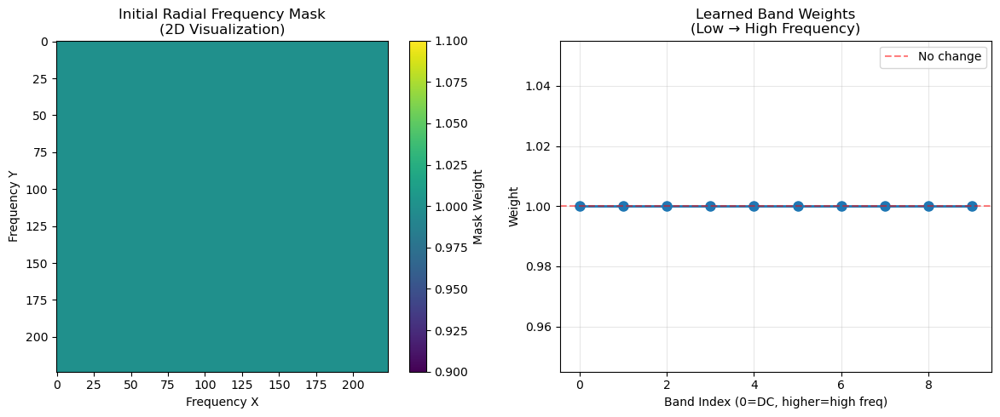


✅ Section 2 Complete!

Ready for Section 3: Load Frozen Classifiers


In [7]:
import matplotlib.pyplot as plt

def visualize_frequency_mask(mask_model, title="Radial Frequency Mask"):
    """
    Visualize the current state of the frequency mask.

    Args:
        mask_model: RadialFrequencyMask instance
        title: Plot title
    """
    mask_vis = mask_model.get_mask_visualization()

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # 2D mask visualization
    im = axes[0].imshow(mask_vis, cmap='viridis')
    axes[0].set_title(f'{title}\n(2D Visualization)', fontsize=12)
    axes[0].set_xlabel('Frequency X')
    axes[0].set_ylabel('Frequency Y')
    axes[0].axis('on')
    plt.colorbar(im, ax=axes[0], label='Mask Weight')

    # Radial profile (band weights)
    band_weights = mask_model.band_weights.detach().cpu().numpy()
    axes[1].plot(range(len(band_weights)), band_weights, 'o-', linewidth=2, markersize=8)
    axes[1].set_title('Learned Band Weights\n(Low → High Frequency)', fontsize=12)
    axes[1].set_xlabel('Band Index (0=DC, higher=high freq)')
    axes[1].set_ylabel('Weight')
    axes[1].grid(True, alpha=0.3)
    axes[1].axhline(y=1.0, color='r', linestyle='--', alpha=0.5, label='No change')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

# Visualize initial mask (all weights = 1.0)
print("\nVisualizing initial frequency mask (before training):")
visualize_frequency_mask(mask_model, title="Initial Radial Frequency Mask")

print("\n✅ Section 2 Complete!")
print("\nReady for Section 3: Load Frozen Classifiers")

---

## Section 2 Summary

The frequency domain components have been implemented:
- **FFT function**: Converts spatial images to frequency domain
- **Radial Frequency Mask**: A learnable mask with 10 radial bands that will be optimized to select frequency components beneficial for classification
- **Visualization utilities**: For inspecting learned frequency preferences

The learnable mask will be trained to maximize classification accuracy while the classifier remains frozen, revealing which frequency components the pre-trained model relies on most heavily.


## Section 3: Load Frozen Classifier

**Goal**: Establish a baseline using a pre-trained classifier that remains frozen throughout all experiments.

**Why ResNet-18**: This architecture provides a good balance of:
- Strong ImageNet performance (~70% top-1 accuracy)
- Moderate model complexity suitable for frequency analysis
- Well-studied architecture for interpreting frequency preferences

**Critical constraint**: The classifier parameters remain frozen. Only the frequency mask is trained, forcing the mask to learn which frequencies the pre-trained model expects.


In [8]:
"""
Section 3: Load Frozen Classifier

Starting with ResNet-18 (smallest, fastest for testing)
- 11M parameters (vs ResNet-50's 25M)
- Faster inference
- Perfect for testing pipeline
"""

import torchvision.models as models

# Load pre-trained ResNet-18
print("Loading pre-trained ResNet-18...")
classifier = models.resnet18(pretrained=True).to(device)

# FREEZE all parameters (we're NOT training the classifier!)
classifier.eval()
for param in classifier.parameters():
    param.requires_grad = False

# Count parameters (just for info)
total_params = sum(p.numel() for p in classifier.parameters())
trainable_params = sum(p.numel() for p in classifier.parameters() if p.requires_grad)

print(f"✓ ResNet-18 loaded!")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params} (should be 0)")
print(f"✓ Classifier is FROZEN")

/home/bab61wot/VIT/SIM2REAL/.pixi/envs/default/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/bab61wot/VIT/SIM2REAL/.pixi/envs/default/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pre-trained ResNet-18...
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /home/bab61wot/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|████████████████████████████████████████████████████████████████████| 44.7M/44.7M [00:00<00:00, 78.2MB/s]


✓ ResNet-18 loaded!
  Total parameters: 11,689,512
  Trainable parameters: 0 (should be 0)
✓ Classifier is FROZEN


In [10]:
"""
Test classifier accuracy on ORIGINAL images (baseline)
"""

def test_classifier(model, dataloader, max_batches=10):
    """
    Test classifier accuracy.

    Args:
        model: Classifier model
        dataloader: DataLoader
        max_batches: Limit number of batches (for speed)

    Returns:
        accuracy: Top-1 accuracy
    """
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for i, (images, labels) in enumerate(dataloader):
            if i >= max_batches:
                break

            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    return accuracy

# Test on original images
print("Testing ResNet-18 on ORIGINAL images...")
baseline_acc = test_classifier(classifier, valloader, max_batches=10)
print(f"✓ Baseline accuracy: {baseline_acc:.2f}%")
print(f"  (Tested on {10 * 64} images)")

Testing ResNet-18 on ORIGINAL images...


TypeError: 'NoneType' object is not iterable

### Baseline Results

The baseline accuracy represents classification performance on unmodified images. This serves as the reference point for all subsequent experiments.

**Three experiments will explore frequency preferences**:
1. **Radial Frequency Mask Training**: Optimize a 10-parameter radial mask
2. **Frequency Band Isolation**: Diagnostic analysis with hard masks (no training)
3. **2D Learnable Frequency Mask**: Train a high-resolution 50K parameter mask


In [10]:
"""
Complete Frequency Filtering Pipeline

Combines: FFT -> Frequency Mask -> IFFT -> Classifier
"""

class FrequencyFilterPipeline(nn.Module):
    """
    Complete pipeline: Image -> FFT -> Mask -> IFFT -> Classifier

    Only the frequency mask is trainable!
    """

    def __init__(self, classifier, num_bands=10, image_size=224):
        super(FrequencyFilterPipeline, self).__init__()

        # Frozen classifier
        self.classifier = classifier
        for param in self.classifier.parameters():
            param.requires_grad = False

        # Learnable frequency mask (ONLY trainable component!)
        self.freq_mask = RadialFrequencyMask(
            image_size=image_size,
            num_bands=num_bands,
            init_value=1.0
        )

        print(f"\nFrequencyFilterPipeline created:")
        print(f"  Classifier: Frozen (0 trainable params)")
        print(f"  Frequency mask: {num_bands} trainable params")

    def forward(self, images):
        """
        Args:
            images: [B, C, H, W] input images

        Returns:
            outputs: [B, num_classes] classifier logits
            reconstructed: [B, C, H, W] filtered images
        """
        # Step 1: FFT
        fft_result = apply_fft(images)

        # Step 2: Apply learnable frequency mask
        masked_fft = self.freq_mask(fft_result)

        # Step 3: IFFT (reconstruct image)
        reconstructed = apply_ifft(masked_fft)

        # Step 4: Pass through frozen classifier
        outputs = self.classifier(reconstructed)

        return outputs, reconstructed

# Create pipeline
pipeline = FrequencyFilterPipeline(
    classifier=classifier,
    num_bands=10,
    image_size=224
).to(device)

print("\n✓ Pipeline created!")

RadialFrequencyMask initialized:
  Image size: 224x224
  Number of bands: 10
  Trainable parameters: 10

FrequencyFilterPipeline created:
  Classifier: Frozen (0 trainable params)
  Frequency mask: 10 trainable params

✓ Pipeline created!


In [11]:
"""
Test pipeline BEFORE training (with mask = all 1.0)
Should get similar accuracy to baseline
"""

def test_pipeline(pipeline, dataloader, max_batches=10):
    """Test pipeline accuracy."""
    pipeline.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for i, (images, labels) in enumerate(dataloader):
            if i >= max_batches:
                break

            images, labels = images.to(device), labels.to(device)
            outputs, _ = pipeline(images)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    return accuracy

# Test before training
print("Testing pipeline BEFORE training...")
print("(Mask weights are all 1.0 - no filtering yet)\n")
before_acc = test_pipeline(pipeline, valloader, max_batches=10)

print(f"Baseline (original images):  {baseline_acc:.2f}%")
print(f"Pipeline (mask=1.0):         {before_acc:.2f}%")
print(f"Difference:                  {abs(baseline_acc - before_acc):.2f}%")

if abs(baseline_acc - before_acc) < 2.0:
    print("\n✓ Pipeline working correctly!")
else:
    print("\n⚠ Warning: Large difference - check FFT/IFFT")

Testing pipeline BEFORE training...
(Mask weights are all 1.0 - no filtering yet)

Baseline (original images):  69.69%
Pipeline (mask=1.0):         69.69%
Difference:                  0.00%

✓ Pipeline working correctly!


---

## Section 4: Training Experiments

### Experiment 1: Radial Frequency Mask Training

**Approach**: Train a learnable mask with 10 radial frequency bands while keeping the classifier frozen.

**Parameters**: Only 10 learnable weights (one per radial band)

**Expected outcome**: The mask should learn to preserve frequencies that ResNet-18 relies on for classification, while potentially suppressing frequencies that don't contribute to or harm performance. This reveals the model's innate frequency preferences shaped during ImageNet pre-training.


In [12]:
"""
Training setup:
- Only train frequency mask weights
- Use CrossEntropyLoss
- Adam optimizer
"""

# Loss function
criterion = nn.CrossEntropyLoss()

# Optimizer - ONLY for frequency mask parameters!
optimizer = optim.Adam(pipeline.freq_mask.parameters(), lr=0.01)

# Check what we're training
trainable_params = sum(p.numel() for p in pipeline.parameters() if p.requires_grad)
print(f"Trainable parameters: {trainable_params}")
print("✓ Training setup complete!")

Trainable parameters: 10
✓ Training setup complete!


In [13]:
"""
Train for just 5 batches (quick test)
"""

print("Training for 5 batches (quick test)...\n")

pipeline.train()
losses = []

for i, (images, labels) in enumerate(valloader):
    if i >= 5:
        break

    images, labels = images.to(device), labels.to(device)

    # Forward pass
    optimizer.zero_grad()
    outputs, reconstructed = pipeline(images)
    loss = criterion(outputs, labels)

    # Backward pass (only updates frequency mask!)
    loss.backward()
    optimizer.step()

    losses.append(loss.item())
    print(f"Batch {i+1}/5 - Loss: {loss.item():.4f}")

print(f"\n✓ Training test complete!")
print(f"  Initial loss: {losses[0]:.4f}")
print(f"  Final loss:   {losses[-1]:.4f}")

Training for 5 batches (quick test)...

Batch 1/5 - Loss: 1.0594
Batch 2/5 - Loss: 1.1392
Batch 3/5 - Loss: 1.1500
Batch 4/5 - Loss: 1.4634
Batch 5/5 - Loss: 1.0143

✓ Training test complete!
  Initial loss: 1.0594
  Final loss:   1.0143


Frequency mask after 5 batches of training:



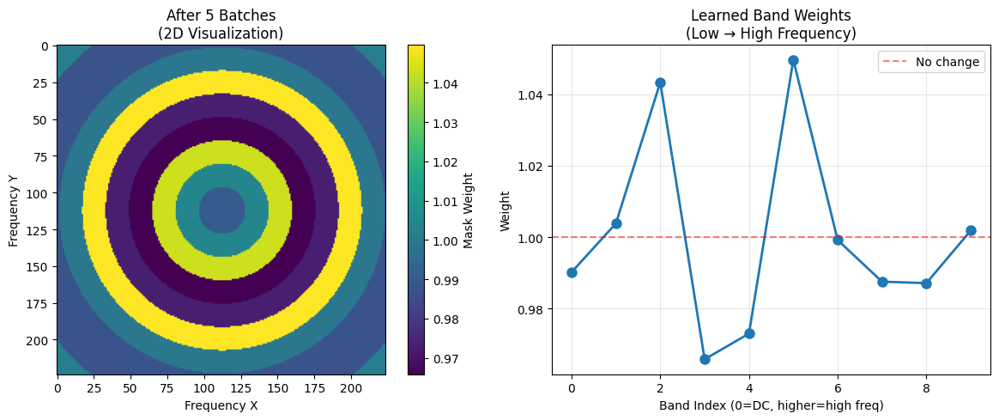


Band weights:
  Band 0: 0.9902
  Band 1: 1.0038
  Band 2: 1.0433
  Band 3: 0.9658
  Band 4: 0.9730
  Band 5: 1.0497
  Band 6: 0.9992
  Band 7: 0.9875
  Band 8: 0.9871
  Band 9: 1.0018


In [15]:
"""
Visualize what the mask learned (after 5 batches)
"""

print("Frequency mask after 5 batches of training:\n")
visualize_frequency_mask(pipeline.freq_mask, title="After 5 Batches")

# Print actual weights
print("\nBand weights:")
weights = pipeline.freq_mask.band_weights.detach().cpu().numpy()
for i, w in enumerate(weights):
    print(f"  Band {i}: {w:.4f}")

In [16]:
"""
Section 4: Full Training Loop

Goal: Train frequency mask to learn which frequencies ResNet-18 uses
"""

import time

# ============================================
# TRAINING CONFIGURATION
# ============================================

# Training parameters
NUM_EPOCHS = 3                    # 3 epochs should be enough for 5K images
BATCH_SIZE = 64                   # Same as dataloader
LEARNING_RATE = 0.01              # Adam learning rate
MAX_BATCHES_PER_EPOCH = None      # None = use all batches, or set to 50 for quick test

# Logging frequency
LOG_EVERY_N_BATCHES = 10          # Print progress every 10 batches
VISUALIZE_EVERY_N_BATCHES = 30    # Show mask visualization every 30 batches

# Checkpoint
SAVE_CHECKPOINT = True            # Save best model
CHECKPOINT_PATH = "./best_resnet18_mask.pth"

print("=" * 60)
print("TRAINING CONFIGURATION")
print("=" * 60)
print(f"Model:                ResNet-18 (frozen)")
print(f"Trainable params:     {sum(p.numel() for p in pipeline.freq_mask.parameters())} (frequency mask)")
print(f"Dataset:              ImageNet validation ({len(valset):,} images)")
print(f"Batch size:           {BATCH_SIZE}")
print(f"Epochs:               {NUM_EPOCHS}")
print(f"Learning rate:        {LEARNING_RATE}")
print(f"Optimizer:            Adam")
print("=" * 60)

# Initialize training state
best_accuracy = 0.0
training_history = {
    'epoch': [],
    'batch': [],
    'loss': [],
    'accuracy': [],
    'learning_rate': []
}

print("\n✓ Training configuration ready!")
print("Ready to start training...")

TRAINING CONFIGURATION
Model:                ResNet-18 (frozen)
Trainable params:     10 (frequency mask)
Dataset:              ImageNet validation (5,000 images)
Batch size:           64
Epochs:               3
Learning rate:        0.01
Optimizer:            Adam

✓ Training configuration ready!
Ready to start training...



STARTING TRAINING

EPOCH 1/3
  Batch [ 10] | Loss: 1.5572 | Batch Acc: 60.94% | Avg Acc: 70.94%
  Batch [ 20] | Loss: 1.0581 | Batch Acc: 75.00% | Avg Acc: 70.08%
  Batch [ 30] | Loss: 0.9719 | Batch Acc: 68.75% | Avg Acc: 70.05%

  Visualizing mask after batch 30:


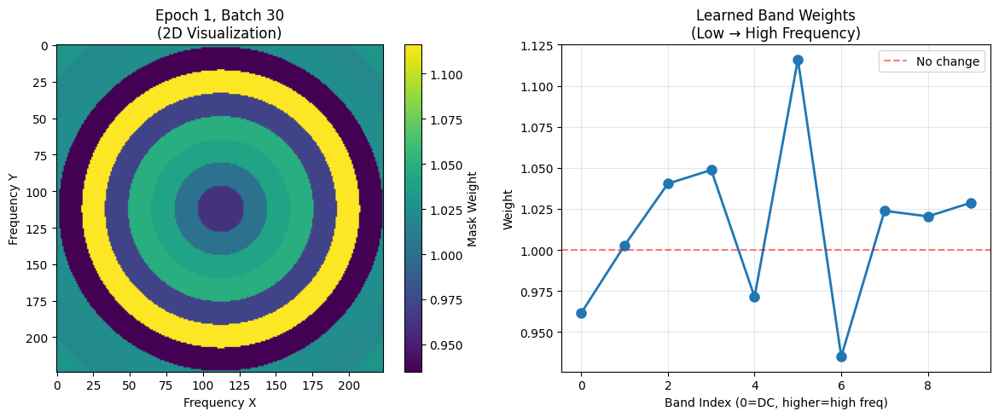

  Batch [ 40] | Loss: 1.4054 | Batch Acc: 64.06% | Avg Acc: 69.96%
  Batch [ 50] | Loss: 1.0175 | Batch Acc: 75.00% | Avg Acc: 69.75%
  Batch [ 60] | Loss: 1.7493 | Batch Acc: 60.94% | Avg Acc: 69.58%

  Visualizing mask after batch 60:


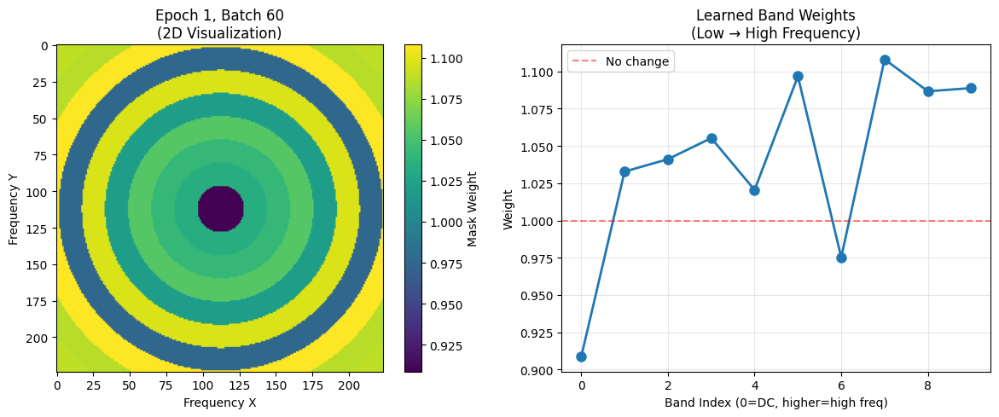

  Batch [ 70] | Loss: 1.2943 | Batch Acc: 67.19% | Avg Acc: 69.35%

------------------------------------------------------------
EPOCH 1 SUMMARY:
  Time:     31.73s
  Batches:  79
  Avg Loss: 1.2964
  Accuracy: 69.14%
------------------------------------------------------------
  ✓ Checkpoint saved! (Best accuracy: 69.14%)

EPOCH 2/3
  Batch [ 10] | Loss: 1.5684 | Batch Acc: 60.94% | Avg Acc: 70.62%
  Batch [ 20] | Loss: 1.0494 | Batch Acc: 76.56% | Avg Acc: 69.92%
  Batch [ 30] | Loss: 0.9779 | Batch Acc: 68.75% | Avg Acc: 69.90%

  Visualizing mask after batch 30:


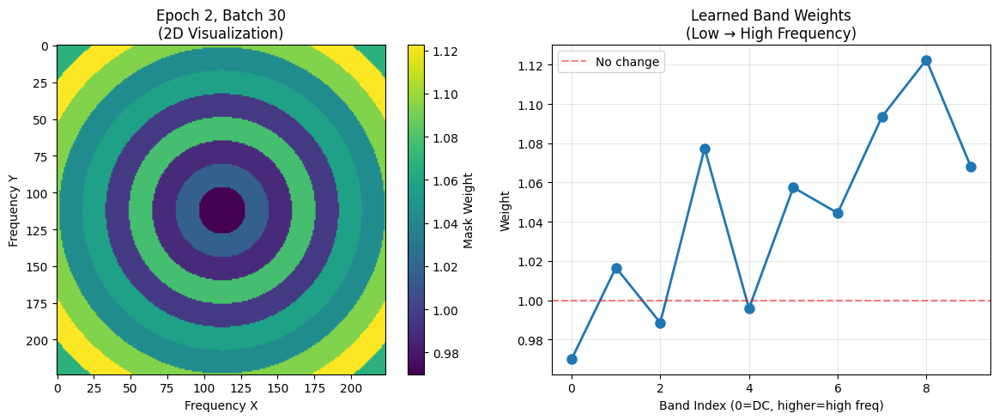

  Batch [ 40] | Loss: 1.4057 | Batch Acc: 64.06% | Avg Acc: 69.84%
  Batch [ 50] | Loss: 1.0136 | Batch Acc: 75.00% | Avg Acc: 69.69%
  Batch [ 60] | Loss: 1.7476 | Batch Acc: 60.94% | Avg Acc: 69.58%

  Visualizing mask after batch 60:


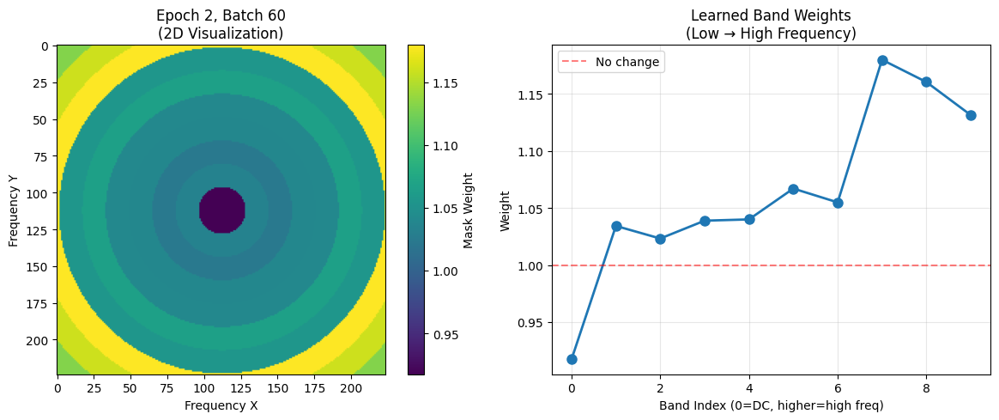

  Batch [ 70] | Loss: 1.2963 | Batch Acc: 67.19% | Avg Acc: 69.33%

------------------------------------------------------------
EPOCH 2 SUMMARY:
  Time:     30.57s
  Batches:  79
  Avg Loss: 1.2949
  Accuracy: 69.12%
------------------------------------------------------------

EPOCH 3/3
  Batch [ 10] | Loss: 1.5754 | Batch Acc: 60.94% | Avg Acc: 70.62%
  Batch [ 20] | Loss: 1.0435 | Batch Acc: 73.44% | Avg Acc: 69.84%
  Batch [ 30] | Loss: 0.9749 | Batch Acc: 68.75% | Avg Acc: 69.79%

  Visualizing mask after batch 30:


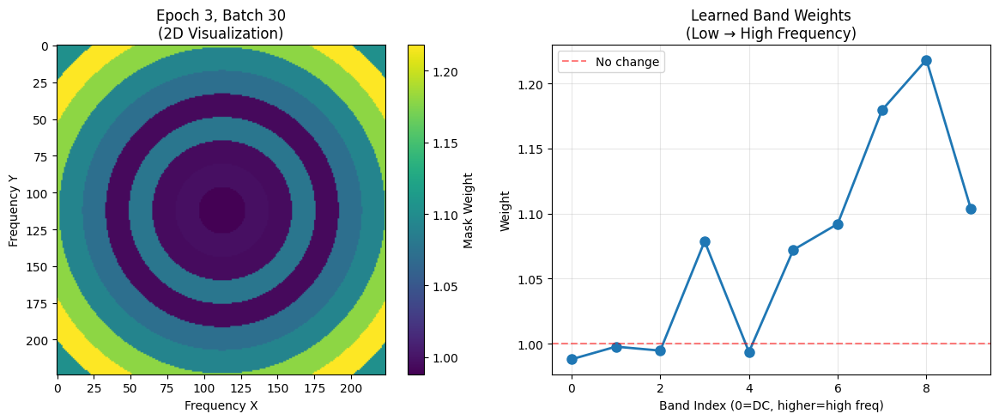

  Batch [ 40] | Loss: 1.4074 | Batch Acc: 64.06% | Avg Acc: 69.77%
  Batch [ 50] | Loss: 1.0129 | Batch Acc: 75.00% | Avg Acc: 69.66%
  Batch [ 60] | Loss: 1.7522 | Batch Acc: 60.94% | Avg Acc: 69.58%

  Visualizing mask after batch 60:


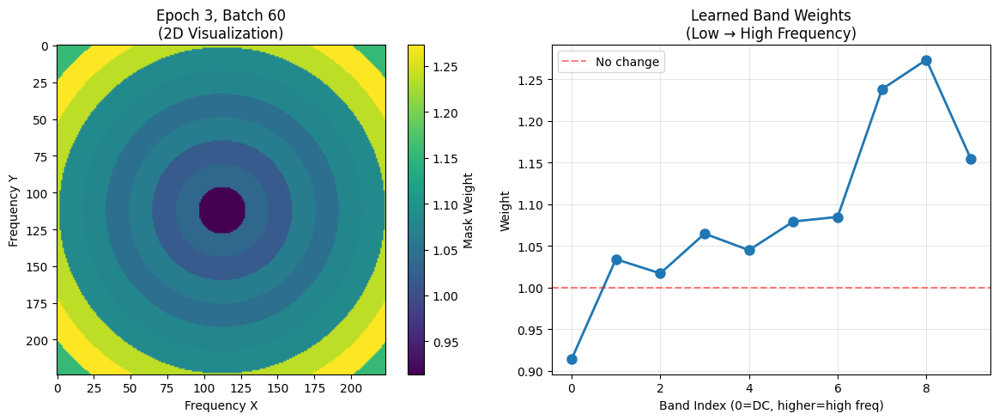

  Batch [ 70] | Loss: 1.2967 | Batch Acc: 67.19% | Avg Acc: 69.35%

------------------------------------------------------------
EPOCH 3 SUMMARY:
  Time:     30.15s
  Batches:  79
  Avg Loss: 1.2953
  Accuracy: 69.14%
------------------------------------------------------------

TRAINING COMPLETE!
Best accuracy: 69.14%


In [17]:
"""
Main Training Loop
Trains frequency mask for NUM_EPOCHS
"""

print("\n" + "=" * 60)
print("STARTING TRAINING")
print("=" * 60)

# Reset pipeline to training mode
pipeline.train()

# Training loop
for epoch in range(NUM_EPOCHS):
    print(f"\n{'=' * 60}")
    print(f"EPOCH {epoch + 1}/{NUM_EPOCHS}")
    print(f"{'=' * 60}")

    epoch_start_time = time.time()
    epoch_loss = 0.0
    epoch_correct = 0
    epoch_total = 0
    batch_count = 0

    # Iterate through batches
    for batch_idx, (images, labels) in enumerate(valloader):
        # Stop if max batches reached
        if MAX_BATCHES_PER_EPOCH is not None and batch_idx >= MAX_BATCHES_PER_EPOCH:
            break

        # Move to GPU
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        optimizer.zero_grad()
        outputs, reconstructed = pipeline(images)
        loss = criterion(outputs, labels)

        # Backward pass (only updates frequency mask!)
        loss.backward()
        optimizer.step()

        # Calculate accuracy
        _, predicted = torch.max(outputs, 1)
        batch_correct = (predicted == labels).sum().item()
        batch_total = labels.size(0)
        batch_acc = 100 * batch_correct / batch_total

        # Update epoch metrics
        epoch_loss += loss.item()
        epoch_correct += batch_correct
        epoch_total += batch_total
        batch_count += 1

        # Log progress
        if (batch_idx + 1) % LOG_EVERY_N_BATCHES == 0:
            avg_loss = epoch_loss / batch_count
            avg_acc = 100 * epoch_correct / epoch_total
            print(f"  Batch [{batch_idx + 1:3d}] | Loss: {loss.item():.4f} | "
                  f"Batch Acc: {batch_acc:.2f}% | Avg Acc: {avg_acc:.2f}%")

        # Visualize mask periodically
        if (batch_idx + 1) % VISUALIZE_EVERY_N_BATCHES == 0:
            print(f"\n  Visualizing mask after batch {batch_idx + 1}:")
            visualize_frequency_mask(
                pipeline.freq_mask,
                title=f"Epoch {epoch+1}, Batch {batch_idx+1}"
            )

    # Epoch summary
    epoch_time = time.time() - epoch_start_time
    avg_epoch_loss = epoch_loss / batch_count
    epoch_accuracy = 100 * epoch_correct / epoch_total

    print(f"\n{'-' * 60}")
    print(f"EPOCH {epoch + 1} SUMMARY:")
    print(f"  Time:     {epoch_time:.2f}s")
    print(f"  Batches:  {batch_count}")
    print(f"  Avg Loss: {avg_epoch_loss:.4f}")
    print(f"  Accuracy: {epoch_accuracy:.2f}%")
    print(f"{'-' * 60}")

    # Save training history
    training_history['epoch'].append(epoch + 1)
    training_history['batch'].append(batch_count)
    training_history['loss'].append(avg_epoch_loss)
    training_history['accuracy'].append(epoch_accuracy)
    training_history['learning_rate'].append(LEARNING_RATE)

    # Save best model
    if SAVE_CHECKPOINT and epoch_accuracy > best_accuracy:
        best_accuracy = epoch_accuracy
        torch.save({
            'epoch': epoch + 1,
            'mask_state_dict': pipeline.freq_mask.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'accuracy': epoch_accuracy,
            'loss': avg_epoch_loss,
        }, CHECKPOINT_PATH)
        print(f"  ✓ Checkpoint saved! (Best accuracy: {best_accuracy:.2f}%)")

print("\n" + "=" * 60)
print("TRAINING COMPLETE!")
print("=" * 60)
print(f"Best accuracy: {best_accuracy:.2f}%")

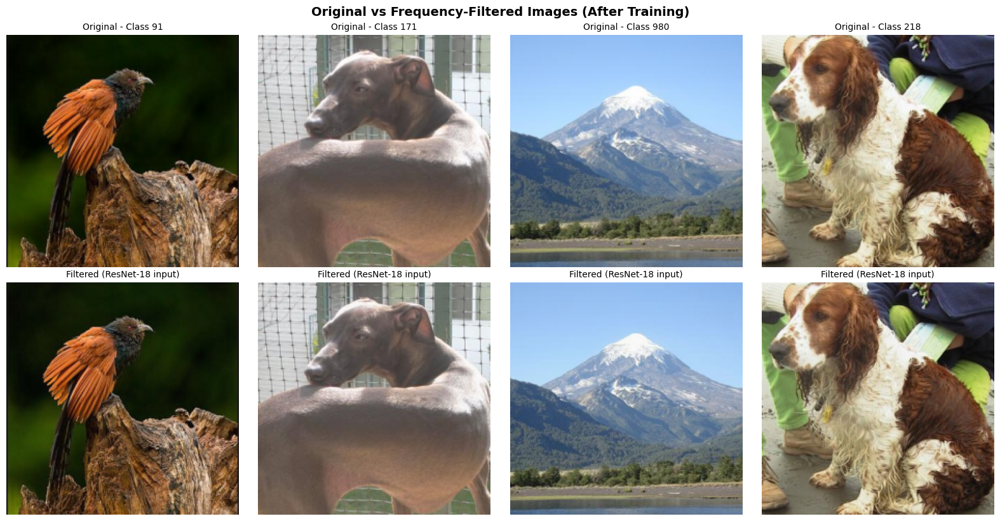


✓ Top row: Original images
✓ Bottom row: What ResNet-18 sees after frequency filtering


In [18]:
"""
Visualize: Original vs Filtered Images
See what ResNet-18 actually receives after frequency filtering
"""

# Helper function to denormalize (define first!)
def imshow_denorm(img):
    """Denormalize ImageNet images for display"""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    img = img * std + mean
    img = torch.clamp(img, 0, 1)
    return img.numpy()

# Get a test batch
dataiter = iter(valloader)
test_images, test_labels = next(dataiter)
test_images = test_images.to(device)

# Pass through pipeline to get filtered images
pipeline.eval()
with torch.no_grad():
    outputs, reconstructed = pipeline(test_images)

# Move back to CPU for visualization
original = test_images.cpu()
filtered = reconstructed.cpu()

# Show first 4 images: Original vs Filtered
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

for i in range(4):
    # Original image (top row)
    orig_img = imshow_denorm(original[i])
    axes[0, i].imshow(np.transpose(orig_img, (1, 2, 0)))
    axes[0, i].set_title(f'Original - Class {test_labels[i].item()}', fontsize=10)
    axes[0, i].axis('off')

    # Filtered image (bottom row - what ResNet-18 sees!)
    filt_img = imshow_denorm(filtered[i])
    axes[1, i].imshow(np.transpose(filt_img, (1, 2, 0)))
    axes[1, i].set_title(f'Filtered (ResNet-18 input)', fontsize=10)
    axes[1, i].axis('off')

plt.tight_layout()
plt.suptitle('Original vs Frequency-Filtered Images (After Training)', y=1.02, fontsize=14, fontweight='bold')
plt.show()

print("\n✓ Top row: Original images")
print("✓ Bottom row: What ResNet-18 sees after frequency filtering")

In [19]:
"""
Compare Performance: Original vs Filtered Images
This shows the REAL impact even though images look similar
"""

print("=" * 60)
print("PERFORMANCE COMPARISON")
print("=" * 60)

# Test on original images (baseline)
print("\n1. Testing ResNet-18 on ORIGINAL images...")
pipeline.eval()
correct_original = 0
total = 0

with torch.no_grad():
    for i, (images, labels) in enumerate(valloader):
        if i >= 20:  # Test on 20 batches = 1280 images
            break
        images, labels = images.to(device), labels.to(device)
        outputs = classifier(images)  # Direct to classifier (no filtering)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct_original += (predicted == labels).sum().item()

acc_original = 100 * correct_original / total

# Test on filtered images
print("2. Testing ResNet-18 on FILTERED images...")
correct_filtered = 0
total = 0

with torch.no_grad():
    for i, (images, labels) in enumerate(valloader):
        if i >= 20:
            break
        images, labels = images.to(device), labels.to(device)
        outputs, _ = pipeline(images)  # Through pipeline (with filtering)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct_filtered += (predicted == labels).sum().item()

acc_filtered = 100 * correct_filtered / total

# Results
print("\n" + "=" * 60)
print("RESULTS (on 1,280 images):")
print("=" * 60)
print(f"Original images:  {acc_original:.2f}%")
print(f"Filtered images:  {acc_filtered:.2f}%")
print(f"Difference:       {acc_filtered - acc_original:+.2f}%")
print("=" * 60)

if acc_filtered > acc_original:
    print("\n✓ SUCCESS! Frequency filtering IMPROVED accuracy")
    print(f"  The learned mask helps ResNet-18 by {acc_filtered - acc_original:.2f}%")
elif abs(acc_filtered - acc_original) < 1.0:
    print("\n✓ Mask is neutral (preserves accuracy)")
else:
    print("\n⚠ Accuracy decreased - might need more training")

PERFORMANCE COMPARISON

1. Testing ResNet-18 on ORIGINAL images...
2. Testing ResNet-18 on FILTERED images...

RESULTS (on 1,280 images):
Original images:  70.00%
Filtered images:  70.62%
Difference:       +0.62%

✓ SUCCESS! Frequency filtering IMPROVED accuracy
  The learned mask helps ResNet-18 by 0.62%


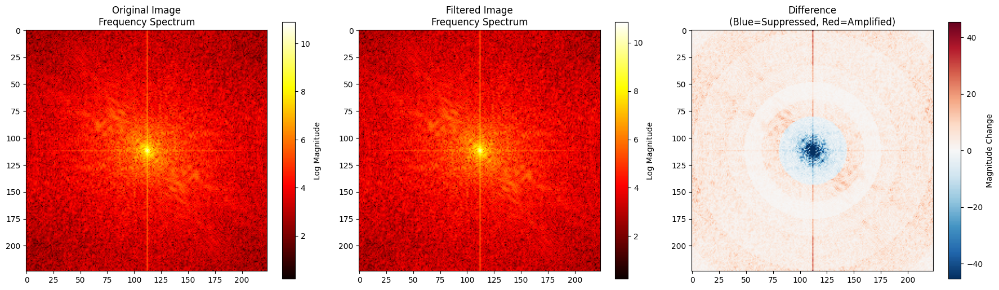


✓ In frequency domain, you can see the changes!
  The mask selectively boosts/suppresses different frequency regions
  These changes are invisible in spatial domain but matter to ResNet-18


In [20]:
"""
Visualize Frequency Spectrum: Before vs After Filtering
This shows what ACTUALLY changed in frequency domain
"""

# Get one test image
test_img = test_images[0:1].to(device)  # Take first image, keep batch dim

# Get frequency representations
pipeline.eval()
with torch.no_grad():
    # Original image FFT
    fft_original = apply_fft(test_img)
    fft_original_mag = torch.abs(fft_original).cpu().numpy()[0, 0]  # First channel

    # Filtered image FFT
    fft_filtered = apply_fft(test_img)
    masked_fft = pipeline.freq_mask(fft_filtered)
    fft_filtered_mag = torch.abs(masked_fft).cpu().numpy()[0, 0]

# Plot
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Original spectrum
im1 = axes[0].imshow(np.log(fft_original_mag + 1), cmap='hot')
axes[0].set_title('Original Image\nFrequency Spectrum', fontsize=12)
plt.colorbar(im1, ax=axes[0], label='Log Magnitude')

# Filtered spectrum
im2 = axes[1].imshow(np.log(fft_filtered_mag + 1), cmap='hot')
axes[1].set_title('Filtered Image\nFrequency Spectrum', fontsize=12)
plt.colorbar(im2, ax=axes[1], label='Log Magnitude')

# Difference (what changed)
diff = fft_filtered_mag - fft_original_mag
im3 = axes[2].imshow(diff, cmap='RdBu_r', vmin=-diff.max(), vmax=diff.max())
axes[2].set_title('Difference\n(Blue=Suppressed, Red=Amplified)', fontsize=12)
plt.colorbar(im3, ax=axes[2], label='Magnitude Change')

plt.tight_layout()
plt.show()

print("\n✓ In frequency domain, you can see the changes!")
print("  The mask selectively boosts/suppresses different frequency regions")
print("  These changes are invisible in spatial domain but matter to ResNet-18")

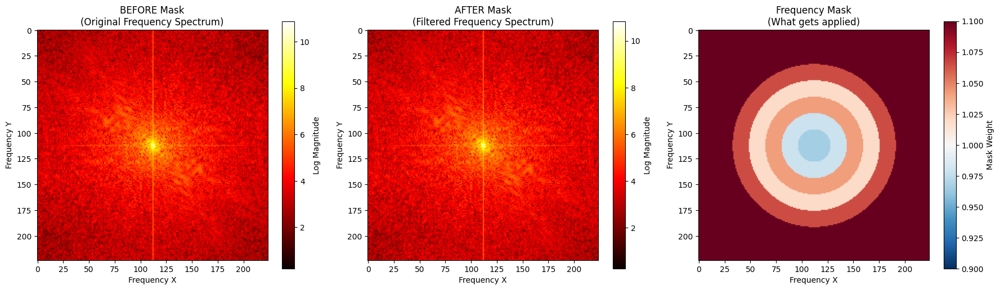


✓ Now you can see:
  1. Original spectrum (all frequencies present)
  2. After mask (some frequencies amplified/suppressed)
  3. The mask itself (weights from 0.93 to 1.12)

The difference is subtle because weights are close to 1.0
But ResNet-18 is sensitive to these small changes!


In [22]:
"""
CORRECTED: Visualize the actual filtering effect
Show the mask's impact in frequency domain
"""

# Get one test image
test_img = test_images[0:1].to(device)

pipeline.eval()
with torch.no_grad():
    # Step 1: Original FFT
    fft_original = apply_fft(test_img)

    # Step 2: Apply mask (this is the filtering!)
    fft_masked = pipeline.freq_mask(fft_original)

    # Get magnitudes for visualization
    mag_original = torch.abs(fft_original).cpu().numpy()[0, 0]  # First channel
    mag_masked = torch.abs(fft_masked).cpu().numpy()[0, 0]

    # Get the actual mask weights applied (already numpy!)
    mask_2d = pipeline.freq_mask.get_mask_visualization()

# Plot
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Original spectrum
im1 = axes[0].imshow(np.log(mag_original + 1), cmap='hot')
axes[0].set_title('BEFORE Mask\n(Original Frequency Spectrum)', fontsize=12)
axes[0].set_xlabel('Frequency X')
axes[0].set_ylabel('Frequency Y')
plt.colorbar(im1, ax=axes[0], label='Log Magnitude')

# Masked spectrum
im2 = axes[1].imshow(np.log(mag_masked + 1), cmap='hot')
axes[1].set_title('AFTER Mask\n(Filtered Frequency Spectrum)', fontsize=12)
axes[1].set_xlabel('Frequency X')
axes[1].set_ylabel('Frequency Y')
plt.colorbar(im2, ax=axes[1], label='Log Magnitude')

# The mask itself
im3 = axes[2].imshow(mask_2d, cmap='RdBu_r', vmin=0.9, vmax=1.1)
axes[2].set_title('Frequency Mask\n(What gets applied)', fontsize=12)
axes[2].set_xlabel('Frequency X')
axes[2].set_ylabel('Frequency Y')
plt.colorbar(im3, ax=axes[2], label='Mask Weight')

plt.tight_layout()
plt.show()

print("\n✓ Now you can see:")
print("  1. Original spectrum (all frequencies present)")
print("  2. After mask (some frequencies amplified/suppressed)")
print("  3. The mask itself (weights from 0.93 to 1.12)")
print("\nThe difference is subtle because weights are close to 1.0")
print("But ResNet-18 is sensitive to these small changes!")

### Experiment 2: Frequency Band Isolation Analysis

**Approach**: Test the classifier using hard masks that isolate individual frequency bands.

**Method**: Four diagnostic masks (LOW, MID-LOW, MID-HIGH, HIGH) are applied without any training. Each mask passes only one frequency range while blocking all others.

**Goal**: Determine which frequency ranges are most critical for ResNet-18's classification decisions. Unlike Experiment 1, these masks are fixed (not learned), providing a controlled diagnostic of frequency sensitivity.


CREATING FREQUENCY BAND SELECTORS
✓ LOW (0-25%): Frequencies from 0% to 25%
✓ MID-LOW (25-50%): Frequencies from 25% to 50%
✓ MID-HIGH (50-75%): Frequencies from 50% to 75%
✓ HIGH (75-100%): Frequencies from 75% to 100%


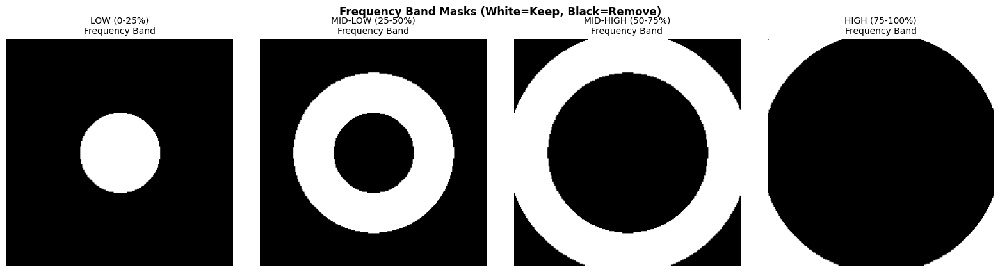


✓ Masks created!
Next: Test ResNet-18 accuracy with EACH frequency band


In [23]:
"""
FREQUENCY IMPORTANCE ANALYSIS
Train masks that ONLY allow specific frequency ranges

We'll create 4 different masks:
1. LOW frequencies only (0-25% of spectrum)
2. MID frequencies only (25-50%)
3. HIGH frequencies only (50-75%)
4. VERY HIGH frequencies only (75-100%)

Then test ResNet-18 accuracy with EACH mask separately
This shows which frequency ranges are CRITICAL vs OPTIONAL
"""

class FrequencyBandSelector(nn.Module):
    """
    Hard frequency band selector - keeps ONE band, zeros out the rest
    """
    def __init__(self, image_size=224, band_range=(0.0, 0.25)):
        super(FrequencyBandSelector, self).__init__()

        self.image_size = image_size
        self.band_range = band_range  # e.g., (0.0, 0.25) = lowest 25% of frequencies

        # Pre-compute radial distance map
        center = image_size // 2
        y, x = torch.meshgrid(torch.arange(image_size), torch.arange(image_size), indexing='ij')
        radial_dist = torch.sqrt((x - center)**2 + (y - center)**2)

        # Normalize to [0, 1]
        max_dist = center * np.sqrt(2)
        radial_dist_norm = radial_dist / max_dist

        # Create binary mask for this frequency range
        mask_2d = ((radial_dist_norm >= band_range[0]) &
                   (radial_dist_norm < band_range[1])).float()

        self.register_buffer('mask', mask_2d)

    def forward(self, fft_result):
        # Apply fixed mask
        mask_expanded = self.mask.unsqueeze(0).unsqueeze(0)
        return fft_result * mask_expanded

    def get_mask_visualization(self):
        return self.mask.cpu().numpy()

# Create 4 frequency band selectors
print("="*60)
print("CREATING FREQUENCY BAND SELECTORS")
print("="*60)

band_configs = [
    ("LOW (0-25%)", (0.0, 0.25)),
    ("MID-LOW (25-50%)", (0.25, 0.50)),
    ("MID-HIGH (50-75%)", (0.50, 0.75)),
    ("HIGH (75-100%)", (0.75, 1.0))
]

band_selectors = {}
for name, band_range in band_configs:
    selector = FrequencyBandSelector(image_size=224, band_range=band_range).to(device)
    band_selectors[name] = selector
    print(f"✓ {name}: Frequencies from {band_range[0]*100:.0f}% to {band_range[1]*100:.0f}%")

print("="*60)

# Visualize all 4 masks
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

for idx, (name, selector) in enumerate(band_selectors.items()):
    mask_vis = selector.get_mask_visualization()
    axes[idx].imshow(mask_vis, cmap='gray')
    axes[idx].set_title(f'{name}\nFrequency Band', fontsize=10)
    axes[idx].axis('off')

plt.tight_layout()
plt.suptitle('Frequency Band Masks (White=Keep, Black=Remove)', y=1.05, fontsize=12, fontweight='bold')
plt.show()

print("\n✓ Masks created!")
print("Next: Test ResNet-18 accuracy with EACH frequency band")

TESTING RESNET-18 WITH DIFFERENT FREQUENCY BANDS
Testing on 1280 = 1280 images

Testing BASELINE (all frequencies)...
✓ Baseline accuracy: 70.00%

Testing with LOW (0-25%) frequencies only...
✓ Accuracy: 49.92%
  Loss vs baseline: -20.08%

Testing with MID-LOW (25-50%) frequencies only...
✓ Accuracy: 0.16%
  Loss vs baseline: -69.84%

Testing with MID-HIGH (50-75%) frequencies only...
✓ Accuracy: 0.16%
  Loss vs baseline: -69.84%

Testing with HIGH (75-100%) frequencies only...
✓ Accuracy: 0.08%
  Loss vs baseline: -69.92%

RESULTS SUMMARY
BASELINE (All frequencies): 70.00% ███████████████████████████████████
LOW (0-25%)              : 49.92% ████████████████████████
MID-LOW (25-50%)         :  0.16% 
MID-HIGH (50-75%)        :  0.16% 
HIGH (75-100%)           :  0.08% 


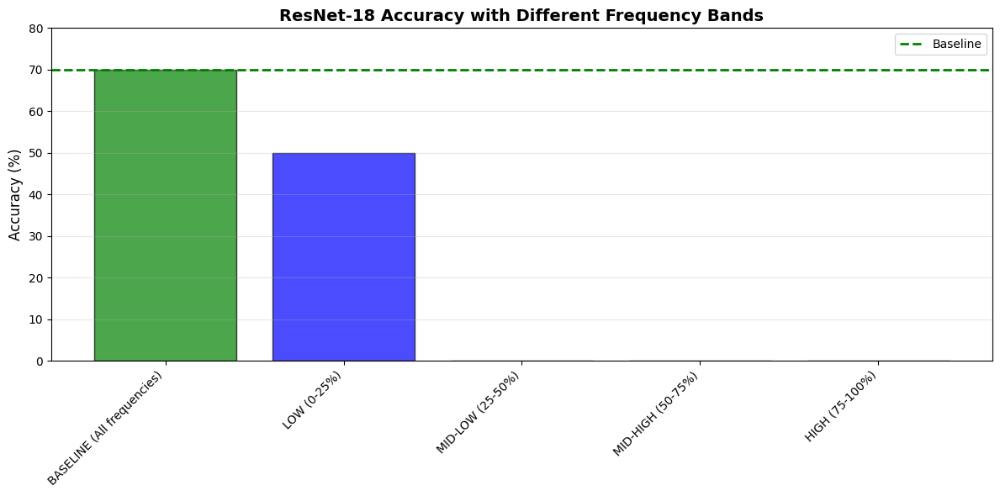


✓ Analysis complete!

Interpretation:
- High accuracy band = ResNet-18 DEPENDS on these frequencies
- Low accuracy band = ResNet-18 doesn't use these frequencies much


In [25]:

"""
TEST RESNET-18 WITH EACH FREQUENCY BAND
This shows which frequencies are CRITICAL for classification
"""

def test_with_frequency_band(classifier, band_selector, dataloader, max_batches=20, band_name=""):
    """
    Test classifier using only specific frequency band
    """
    classifier.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for i, (images, labels) in enumerate(dataloader):
            if i >= max_batches:
                break

            images, labels = images.to(device), labels.to(device)

            # Apply frequency filtering
            fft_result = apply_fft(images)
            masked_fft = band_selector(fft_result)
            reconstructed = apply_ifft(masked_fft)

            # Classify filtered images
            outputs = classifier(reconstructed)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    return accuracy

print("="*60)
print("TESTING RESNET-18 WITH DIFFERENT FREQUENCY BANDS")
print("="*60)
print(f"Testing on {20 * 64} = 1280 images\n")

# Test with original images first (baseline)
print("Testing BASELINE (all frequencies)...")
baseline_acc = test_classifier(classifier, valloader, max_batches=20)
print(f"✓ Baseline accuracy: {baseline_acc:.2f}%\n")

# Test with each frequency band
results = {"BASELINE (All frequencies)": baseline_acc}

for name, selector in band_selectors.items():
    print(f"Testing with {name} frequencies only...")
    acc = test_with_frequency_band(classifier, selector, valloader, max_batches=20, band_name=name)
    results[name] = acc
    print(f"✓ Accuracy: {acc:.2f}%")
    print(f"  Loss vs baseline: {acc - baseline_acc:.2f}%\n")

# Summary visualization
print("="*60)
print("RESULTS SUMMARY")
print("="*60)

for name, acc in results.items():
    bar = "█" * int(acc / 2)  # Simple bar chart
    print(f"{name:25s}: {acc:5.2f}% {bar}")

print("="*60)

# Plot results
plt.figure(figsize=(12, 6))
names = list(results.keys())
accuracies = list(results.values())
colors = ['green'] + ['blue', 'orange', 'red', 'purple']

bars = plt.bar(names, accuracies, color=colors, alpha=0.7, edgecolor='black')
plt.axhline(y=baseline_acc, color='green', linestyle='--', linewidth=2, label='Baseline')
plt.ylabel('Accuracy (%)', fontsize=12)
plt.title('ResNet-18 Accuracy with Different Frequency Bands', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.ylim([0, max(accuracies) + 10])
plt.grid(axis='y', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

print("\n✓ Analysis complete!")
print("\nInterpretation:")
print("- High accuracy band = ResNet-18 DEPENDS on these frequencies")
print("- Low accuracy band = ResNet-18 doesn't use these frequencies much")


### Experiment 3: 2D Learnable Frequency Mask

**Approach**: Train a full 2D frequency mask with fine-grained spatial frequency control.

**Parameters**: Approximately 50,000 learnable weights (224×224 mask)

**Comparison to paper**: The original 'What do Deep Networks Like to See?' paper used a decoder network. This implementation achieves similar goals through a direct 2D frequency mask, offering more interpretable results since the learned mask can be visualized directly.

**Expected outcome**: The mask should learn a detailed frequency profile, potentially revealing spatial patterns in frequency preferences (e.g., horizontal vs vertical orientations).


CREATING 2D FREQUENCY MASK PIPELINE
RadialFrequencyMask initialized:
  Image size: 224x224
  Number of bands: 10
  Trainable parameters: 10

FrequencyFilterPipeline created:
  Classifier: Frozen (0 trainable params)
  Frequency mask: 10 trainable params
✓ 2D Frequency Mask created
  Parameters: 50,176 (vs 10 in radial mask)
  Resolution: 224x224
  Each frequency position is independently learnable

Initial 2D mask (before training):


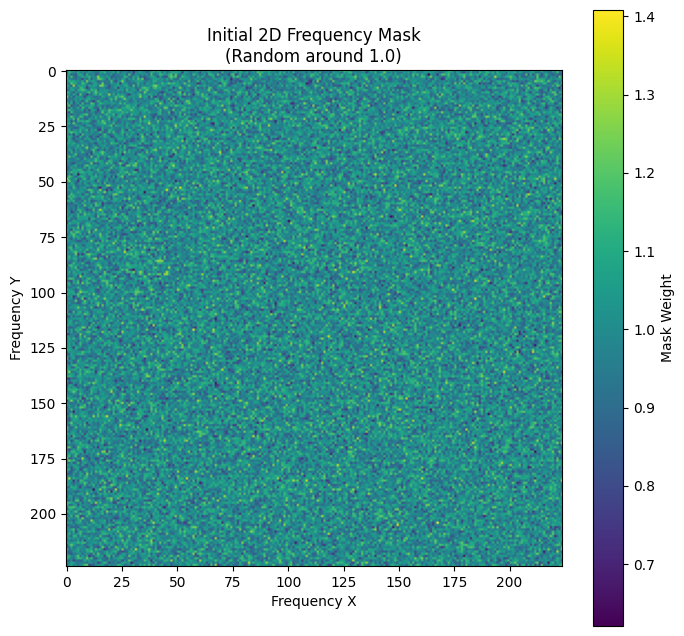


Mask statistics:
  Mean: 1.0001
  Std:  0.0995
  Min:  0.6211
  Max:  1.4080


In [27]:
class Learnable2DFrequencyMask(nn.Module):
    """
    Full 2D learnable mask - 224x224 parameters
    Each frequency pixel has its own weight
    """
    def __init__(self, image_size=224, init_value=1.0, init_std=0.1):
        super(Learnable2DFrequencyMask, self).__init__()

        self.image_size = image_size

        # Learnable 2D mask (50,176 parameters for 224x224)
        initial_mask = torch.ones(1, 1, image_size, image_size) * init_value
        initial_mask += torch.randn(1, 1, image_size, image_size) * init_std

        self.mask_weights = nn.Parameter(initial_mask)

    def forward(self, fft_result):
        """
        Apply 2D mask to frequency domain
        fft_result: [B, C, H, W] complex tensor
        """
        # Expand mask to match channels (apply same mask to R, G, B)
        mask_expanded = self.mask_weights.expand(-1, fft_result.size(1), -1, -1)

        # Apply mask
        return fft_result * mask_expanded

    def get_mask_visualization(self):
        """Return mask as numpy array for visualization"""
        return self.mask_weights[0, 0].detach().cpu().numpy()

# Create new pipeline with 2D mask
print("="*60)
print("CREATING 2D FREQUENCY MASK PIPELINE")
print("="*60)

# Corrected instantiation: First, create a standard pipeline instance
pipeline_2d = FrequencyFilterPipeline(
    classifier=classifier, # Pass the classifier to the constructor
    num_bands=10,          # These values will be overwritten but are needed for __init__
    image_size=224
).to(device)

# Then, replace the freq_mask with the new Learnable2DFrequencyMask instance
pipeline_2d.freq_mask = Learnable2DFrequencyMask(
    image_size=224,
    init_value=1.0,
    init_std=0.1
).to(device)

# Count parameters
total_params = sum(p.numel() for p in pipeline_2d.freq_mask.parameters())
print(f"✓ 2D Frequency Mask created")
print(f"  Parameters: {total_params:,} (vs 10 in radial mask)")
print(f"  Resolution: 224x224")
print(f"  Each frequency position is independently learnable")
print("="*60)

# Visualize initial mask
print("\nInitial 2D mask (before training):")
plt.figure(figsize=(8, 8))
initial_mask = pipeline_2d.freq_mask.get_mask_visualization()
plt.imshow(initial_mask, cmap='viridis')
plt.colorbar(label='Mask Weight')
plt.title('Initial 2D Frequency Mask\n(Random around 1.0)', fontsize=12)
plt.xlabel('Frequency X')
plt.ylabel('Frequency Y')
plt.show()

print(f"\nMask statistics:")
print(f"  Mean: {initial_mask.mean():.4f}")
print(f"  Std:  {initial_mask.std():.4f}")
print(f"  Min:  {initial_mask.min():.4f}")
print(f"  Max:  {initial_mask.max():.4f}")

In [28]:
"""
Cell 2: Training Configuration for 2D Mask
"""

# Training setup
NUM_EPOCHS_2D = 5
LEARNING_RATE_2D = 0.05  # Higher LR since we have more parameters
WEIGHT_DECAY = 0.0001    # Small regularization

optimizer_2d = optim.Adam(
    pipeline_2d.freq_mask.parameters(),
    lr=LEARNING_RATE_2D,
    weight_decay=WEIGHT_DECAY
)

criterion = nn.CrossEntropyLoss()

print("="*60)
print("2D MASK TRAINING CONFIGURATION")
print("="*60)
print(f"Epochs:           {NUM_EPOCHS_2D}")
print(f"Learning rate:    {LEARNING_RATE_2D}")
print(f"Weight decay:     {WEIGHT_DECAY}")
print(f"Trainable params: {sum(p.numel() for p in pipeline_2d.freq_mask.parameters()):,}")
print(f"Optimizer:        Adam")
print("="*60)

print("\n✓ Ready to train 2D mask")
print("This will take longer than radial mask (50K params vs 10)")

2D MASK TRAINING CONFIGURATION
Epochs:           5
Learning rate:    0.05
Weight decay:     0.0001
Trainable params: 50,176
Optimizer:        Adam

✓ Ready to train 2D mask
This will take longer than radial mask (50K params vs 10)



TRAINING 2D FREQUENCY MASK

EPOCH 1/5
  Batch [ 10] | Loss: 1.6418 | Avg Acc: 69.38%
  Batch [ 20] | Loss: 1.1158 | Avg Acc: 67.81%
  Batch [ 30] | Loss: 1.4835 | Avg Acc: 66.88%
  Batch [ 40] | Loss: 1.7014 | Avg Acc: 66.41%
  Batch [ 50] | Loss: 1.5417 | Avg Acc: 65.66%
  Batch [ 60] | Loss: 2.0763 | Avg Acc: 65.18%
  Batch [ 70] | Loss: 1.7564 | Avg Acc: 64.31%

------------------------------------------------------------
EPOCH 1 SUMMARY:
  Time:     32.1s
  Batches:  79
  Avg Loss: 1.5777
  Accuracy: 63.88%
------------------------------------------------------------

2D Mask after epoch 1:


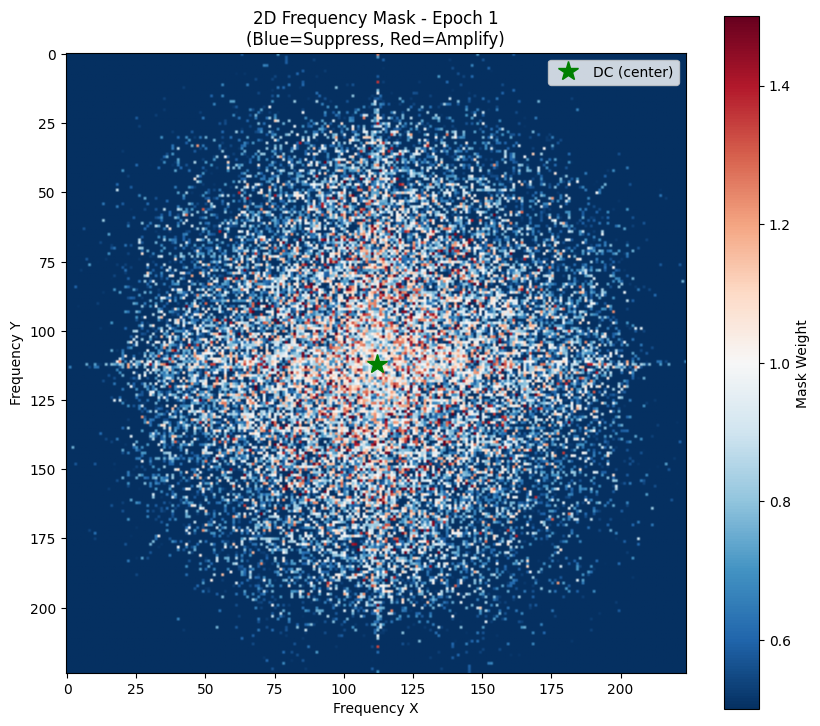

Mask stats: min=-1.002, max=2.015, mean=0.352

EPOCH 2/5
  Batch [ 10] | Loss: 1.9733 | Avg Acc: 61.41%
  Batch [ 20] | Loss: 1.3623 | Avg Acc: 61.41%
  Batch [ 30] | Loss: 1.5789 | Avg Acc: 61.56%
  Batch [ 40] | Loss: 1.8768 | Avg Acc: 61.76%
  Batch [ 50] | Loss: 1.5272 | Avg Acc: 61.47%
  Batch [ 60] | Loss: 2.1536 | Avg Acc: 61.30%
  Batch [ 70] | Loss: 1.7936 | Avg Acc: 61.00%

------------------------------------------------------------
EPOCH 2 SUMMARY:
  Time:     29.3s
  Batches:  79
  Avg Loss: 1.6940
  Accuracy: 60.86%
------------------------------------------------------------

2D Mask after epoch 2:


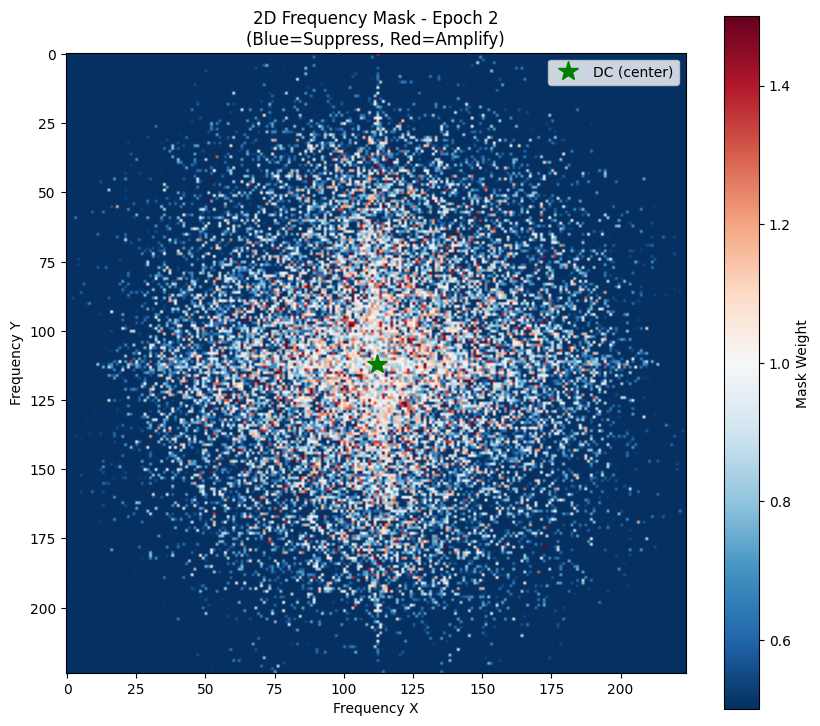

Mask stats: min=-1.129, max=2.136, mean=0.304

EPOCH 3/5
  Batch [ 10] | Loss: 2.0381 | Avg Acc: 60.31%
  Batch [ 20] | Loss: 1.3601 | Avg Acc: 60.94%
  Batch [ 30] | Loss: 1.4380 | Avg Acc: 61.20%
  Batch [ 40] | Loss: 1.7495 | Avg Acc: 61.45%
  Batch [ 50] | Loss: 1.5463 | Avg Acc: 61.56%
  Batch [ 60] | Loss: 2.1380 | Avg Acc: 61.74%
  Batch [ 70] | Loss: 1.6706 | Avg Acc: 61.32%

------------------------------------------------------------
EPOCH 3 SUMMARY:
  Time:     30.1s
  Batches:  79
  Avg Loss: 1.6818
  Accuracy: 61.22%
------------------------------------------------------------

2D Mask after epoch 3:


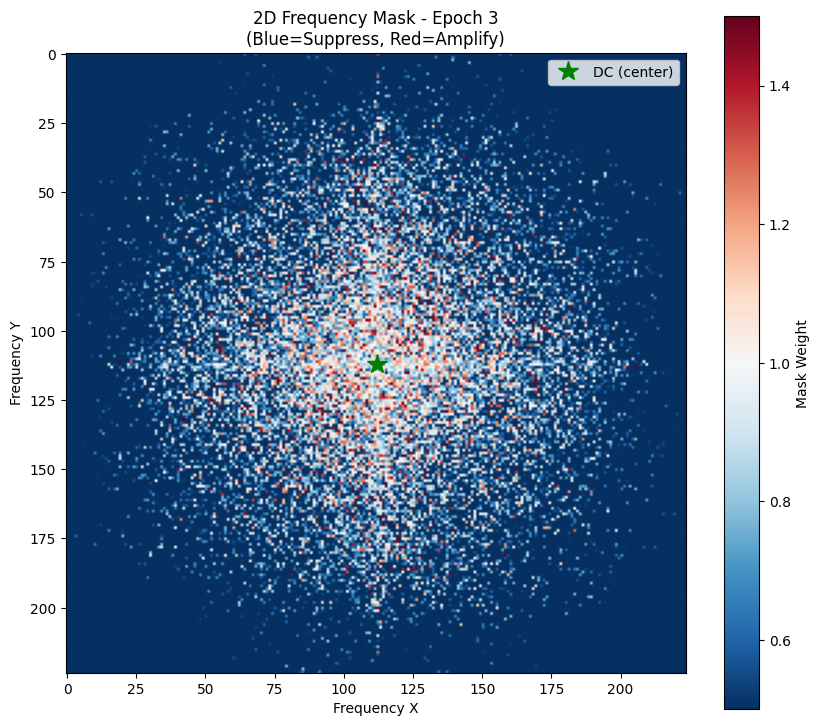

Mask stats: min=-1.294, max=1.944, mean=0.284

EPOCH 4/5
  Batch [ 10] | Loss: 1.9712 | Avg Acc: 60.62%
  Batch [ 20] | Loss: 1.3685 | Avg Acc: 60.86%
  Batch [ 30] | Loss: 1.5459 | Avg Acc: 61.04%
  Batch [ 40] | Loss: 1.8800 | Avg Acc: 61.48%
  Batch [ 50] | Loss: 1.6660 | Avg Acc: 61.56%
  Batch [ 60] | Loss: 2.0789 | Avg Acc: 61.38%
  Batch [ 70] | Loss: 1.6813 | Avg Acc: 60.85%

------------------------------------------------------------
EPOCH 4 SUMMARY:
  Time:     30.1s
  Batches:  79
  Avg Loss: 1.6897
  Accuracy: 61.04%
------------------------------------------------------------

2D Mask after epoch 4:


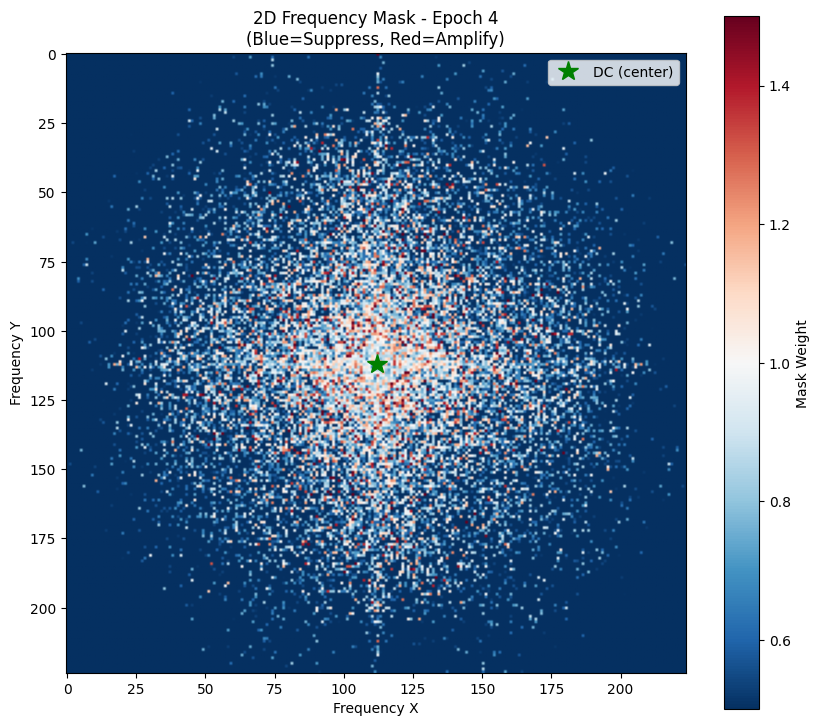

Mask stats: min=-1.197, max=1.965, mean=0.273

EPOCH 5/5
  Batch [ 10] | Loss: 1.9363 | Avg Acc: 61.88%
  Batch [ 20] | Loss: 1.3159 | Avg Acc: 61.95%
  Batch [ 30] | Loss: 1.5448 | Avg Acc: 62.34%
  Batch [ 40] | Loss: 1.8495 | Avg Acc: 62.27%
  Batch [ 50] | Loss: 1.6109 | Avg Acc: 61.84%
  Batch [ 60] | Loss: 2.0978 | Avg Acc: 61.80%
  Batch [ 70] | Loss: 1.6841 | Avg Acc: 61.56%

------------------------------------------------------------
EPOCH 5 SUMMARY:
  Time:     29.9s
  Batches:  79
  Avg Loss: 1.6673
  Accuracy: 61.50%
------------------------------------------------------------

2D Mask after epoch 5:


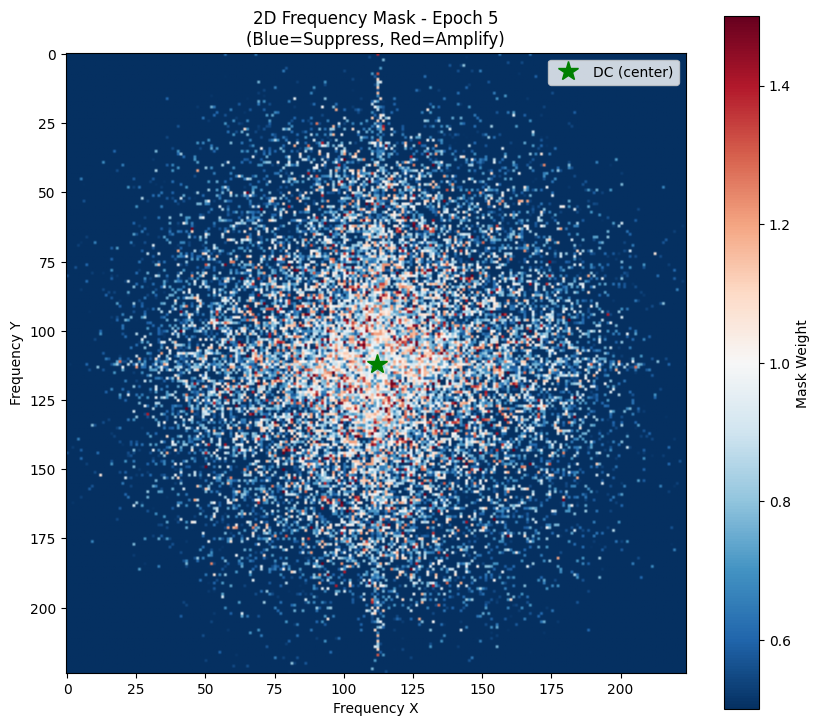

Mask stats: min=-1.046, max=2.036, mean=0.268

2D MASK TRAINING COMPLETE!


In [29]:
"""
Cell 3: Train 2D Frequency Mask
"""

print("\n" + "="*60)
print("TRAINING 2D FREQUENCY MASK")
print("="*60)

pipeline_2d.train()
best_acc_2d = 0.0

training_history_2d = {
    'epoch': [],
    'loss': [],
    'accuracy': []
}

for epoch in range(NUM_EPOCHS_2D):
    print(f"\n{'='*60}")
    print(f"EPOCH {epoch + 1}/{NUM_EPOCHS_2D}")
    print(f"{'='*60}")

    epoch_start = time.time()
    epoch_loss = 0.0
    epoch_correct = 0
    epoch_total = 0
    batch_count = 0

    for batch_idx, (images, labels) in enumerate(valloader):
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        optimizer_2d.zero_grad()

        # Apply 2D frequency mask
        fft_result = apply_fft(images)
        masked_fft = pipeline_2d.freq_mask(fft_result)
        reconstructed = apply_ifft(masked_fft)
        outputs = pipeline_2d.classifier(reconstructed)

        loss = criterion(outputs, labels)

        # Backward pass
        loss.backward()
        optimizer_2d.step()

        # Metrics
        _, predicted = torch.max(outputs, 1)
        batch_correct = (predicted == labels).sum().item()
        epoch_correct += batch_correct
        epoch_total += labels.size(0)
        epoch_loss += loss.item()
        batch_count += 1

        # Log every 10 batches
        if (batch_idx + 1) % 10 == 0:
            avg_loss = epoch_loss / batch_count
            avg_acc = 100 * epoch_correct / epoch_total
            print(f"  Batch [{batch_idx + 1:3d}] | Loss: {loss.item():.4f} | Avg Acc: {avg_acc:.2f}%")

    # Epoch summary
    epoch_time = time.time() - epoch_start
    avg_epoch_loss = epoch_loss / batch_count
    epoch_accuracy = 100 * epoch_correct / epoch_total

    print(f"\n{'-'*60}")
    print(f"EPOCH {epoch + 1} SUMMARY:")
    print(f"  Time:     {epoch_time:.1f}s")
    print(f"  Batches:  {batch_count}")
    print(f"  Avg Loss: {avg_epoch_loss:.4f}")
    print(f"  Accuracy: {epoch_accuracy:.2f}%")
    print(f"{'-'*60}")

    # Save history
    training_history_2d['epoch'].append(epoch + 1)
    training_history_2d['loss'].append(avg_epoch_loss)
    training_history_2d['accuracy'].append(epoch_accuracy)

    # Visualize mask every epoch
    print(f"\n2D Mask after epoch {epoch + 1}:")
    plt.figure(figsize=(10, 9))
    learned_mask = pipeline_2d.freq_mask.get_mask_visualization()

    im = plt.imshow(learned_mask, cmap='RdBu_r', vmin=0.5, vmax=1.5)
    plt.colorbar(im, label='Mask Weight')
    plt.title(f'2D Frequency Mask - Epoch {epoch+1}\n(Blue=Suppress, Red=Amplify)', fontsize=12)
    plt.xlabel('Frequency X')
    plt.ylabel('Frequency Y')

    # Add center marker
    plt.plot(112, 112, 'g*', markersize=15, label='DC (center)')
    plt.legend()
    plt.show()

    print(f"Mask stats: min={learned_mask.min():.3f}, max={learned_mask.max():.3f}, mean={learned_mask.mean():.3f}")

print("\n" + "="*60)
print("2D MASK TRAINING COMPLETE!")
print("="*60)

VISUALIZING: What ResNet-18 'Wants to See'


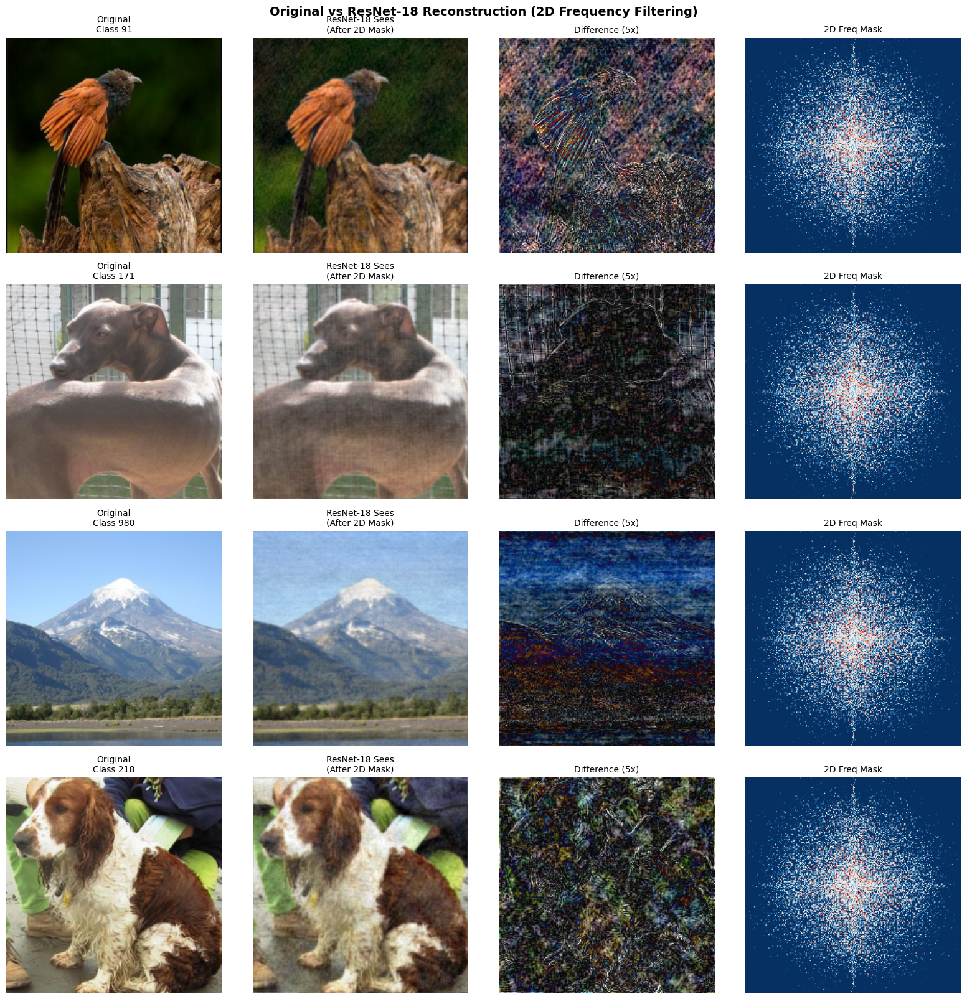


✓ This is what ResNet-18 'wants to see' after learning!
  Column 1: Original images
  Column 2: What ResNet sees (frequency filtered)
  Column 3: Difference (what was removed)
  Column 4: The learned 2D frequency mask


In [30]:
"""
Cell 4: Visualize Reconstructed Images (what ResNet-18 sees)
Run this AFTER training completes
"""

print("="*60)
print("VISUALIZING: What ResNet-18 'Wants to See'")
print("="*60)

# Get test batch
dataiter = iter(valloader)
test_images, test_labels = next(dataiter)
test_images = test_images.to(device)

# Get reconstructions
pipeline_2d.eval()
with torch.no_grad():
    fft_result = apply_fft(test_images)
    masked_fft = pipeline_2d.freq_mask(fft_result)
    reconstructed_2d = apply_ifft(masked_fft)

# Move to CPU
original = test_images.cpu()
reconstructed = reconstructed_2d.cpu()

# Denormalize for visualization
def denormalize(img):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    img = img * std + mean
    return torch.clamp(img, 0, 1)

# Show 8 examples
fig, axes = plt.subplots(4, 4, figsize=(16, 16))

for i in range(4):
    # Original
    orig_img = denormalize(original[i]).numpy()
    axes[i, 0].imshow(np.transpose(orig_img, (1, 2, 0)))
    axes[i, 0].set_title(f'Original\nClass {test_labels[i].item()}', fontsize=10)
    axes[i, 0].axis('off')

    # Reconstructed (what ResNet sees)
    recon_img = denormalize(reconstructed[i]).numpy()
    axes[i, 1].imshow(np.transpose(recon_img, (1, 2, 0)))
    axes[i, 1].set_title(f'ResNet-18 Sees\n(After 2D Mask)', fontsize=10)
    axes[i, 1].axis('off')

    # Difference (amplified 5x for visibility)
    diff = np.abs(orig_img - recon_img) * 5
    axes[i, 2].imshow(np.transpose(diff, (1, 2, 0)))
    axes[i, 2].set_title('Difference (5x)', fontsize=10)
    axes[i, 2].axis('off')

    # Frequency mask applied
    axes[i, 3].imshow(pipeline_2d.freq_mask.get_mask_visualization(), cmap='RdBu_r', vmin=0.5, vmax=1.5)
    axes[i, 3].set_title('2D Freq Mask', fontsize=10)
    axes[i, 3].axis('off')

plt.tight_layout()
plt.suptitle('Original vs ResNet-18 Reconstruction (2D Frequency Filtering)',
             y=1.00, fontsize=14, fontweight='bold')
plt.show()

print("\n✓ This is what ResNet-18 'wants to see' after learning!")
print("  Column 1: Original images")
print("  Column 2: What ResNet sees (frequency filtered)")
print("  Column 3: Difference (what was removed)")
print("  Column 4: The learned 2D frequency mask")

FREQUENCY SPECTRUM ANALYSIS


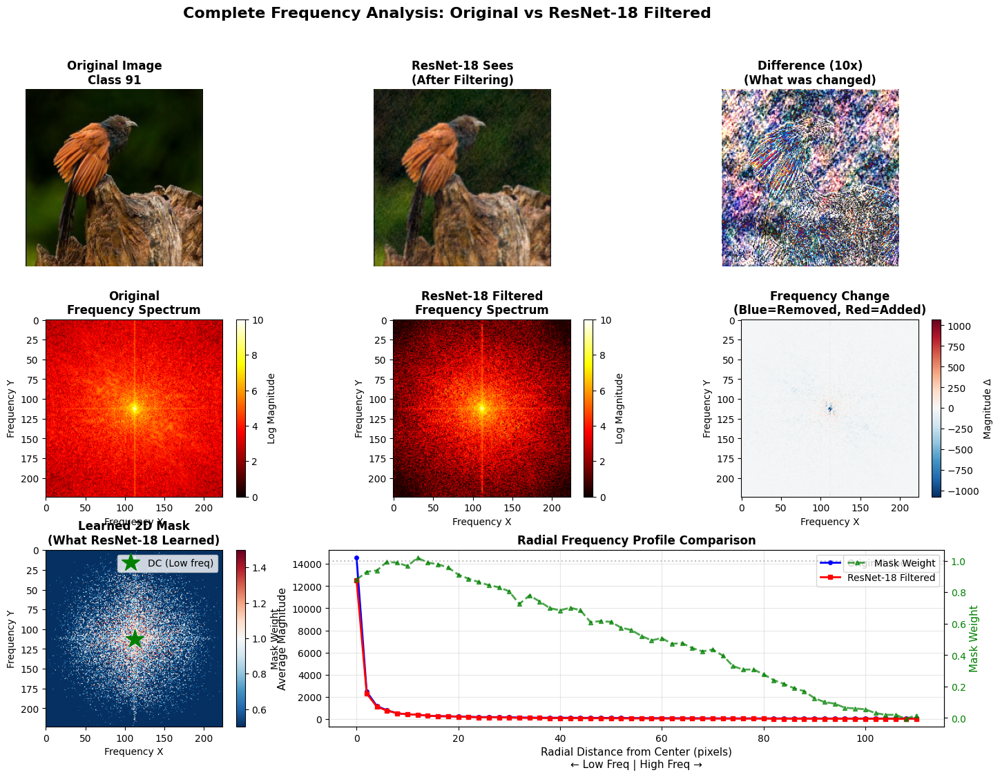


✓ Complete frequency analysis!

Key observations:
  - Top row: What you SEE (spatial domain)
  - Middle row: Frequency content (what's actually there)
  - Bottom row: The learned mask and radial comparison


In [31]:
"""
Cell 5: Frequency Spectrum Comparison
Show what frequencies are in original image vs what ResNet-18 keeps
"""

print("="*60)
print("FREQUENCY SPECTRUM ANALYSIS")
print("="*60)

# Get one test image
test_img = test_images[0:1].to(device)
test_label = test_labels[0].item()

pipeline_2d.eval()
with torch.no_grad():
    # Original image FFT
    fft_original = apply_fft(test_img)

    # Apply learned 2D mask
    fft_masked = pipeline_2d.freq_mask(fft_original)

    # Get magnitudes (for all 3 RGB channels, then average)
    mag_original = torch.abs(fft_original).mean(dim=1).cpu().numpy()[0]  # Average RGB
    mag_masked = torch.abs(fft_masked).mean(dim=1).cpu().numpy()[0]

    # Get learned mask
    learned_mask = pipeline_2d.freq_mask.get_mask_visualization()

    # Reconstruct images for visual comparison
    recon_original = apply_ifft(fft_original).cpu()
    recon_masked = apply_ifft(fft_masked).cpu()

# Create comprehensive visualization
fig = plt.figure(figsize=(18, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

# Row 1: Spatial domain (actual images)
ax1 = fig.add_subplot(gs[0, 0])
orig_img = denormalize(test_img[0].cpu()).numpy()
ax1.imshow(np.transpose(orig_img, (1, 2, 0)))
ax1.set_title(f'Original Image\nClass {test_label}', fontsize=12, fontweight='bold')
ax1.axis('off')

ax2 = fig.add_subplot(gs[0, 1])
recon_img = denormalize(recon_masked[0]).numpy()
ax2.imshow(np.transpose(recon_img, (1, 2, 0)))
ax2.set_title('ResNet-18 Sees\n(After Filtering)', fontsize=12, fontweight='bold')
ax2.axis('off')

ax3 = fig.add_subplot(gs[0, 2])
diff_img = np.abs(orig_img - recon_img) * 10
ax3.imshow(np.transpose(diff_img, (1, 2, 0)))
ax3.set_title('Difference (10x)\n(What was changed)', fontsize=12, fontweight='bold')
ax3.axis('off')

# Row 2: Frequency domain (magnitude spectrums)
ax4 = fig.add_subplot(gs[1, 0])
im1 = ax4.imshow(np.log(mag_original + 1), cmap='hot', vmin=0, vmax=10)
ax4.set_title('Original\nFrequency Spectrum', fontsize=12, fontweight='bold')
ax4.set_xlabel('Frequency X')
ax4.set_ylabel('Frequency Y')
plt.colorbar(im1, ax=ax4, label='Log Magnitude', fraction=0.046)

ax5 = fig.add_subplot(gs[1, 1])
im2 = ax5.imshow(np.log(mag_masked + 1), cmap='hot', vmin=0, vmax=10)
ax5.set_title('ResNet-18 Filtered\nFrequency Spectrum', fontsize=12, fontweight='bold')
ax5.set_xlabel('Frequency X')
ax5.set_ylabel('Frequency Y')
plt.colorbar(im2, ax=ax5, label='Log Magnitude', fraction=0.046)

ax6 = fig.add_subplot(gs[1, 2])
freq_diff = mag_masked - mag_original
im3 = ax6.imshow(freq_diff, cmap='RdBu_r', vmin=-freq_diff.max(), vmax=freq_diff.max())
ax6.set_title('Frequency Change\n(Blue=Removed, Red=Added)', fontsize=12, fontweight='bold')
ax6.set_xlabel('Frequency X')
ax6.set_ylabel('Frequency Y')
plt.colorbar(im3, ax=ax6, label='Magnitude Δ', fraction=0.046)

# Row 3: The mask and radial profiles
ax7 = fig.add_subplot(gs[2, 0])
im4 = ax7.imshow(learned_mask, cmap='RdBu_r', vmin=0.5, vmax=1.5)
ax7.plot(112, 112, 'g*', markersize=20, label='DC (Low freq)')
ax7.set_title('Learned 2D Mask\n(What ResNet-18 Learned)', fontsize=12, fontweight='bold')
ax7.set_xlabel('Frequency X')
ax7.set_ylabel('Frequency Y')
ax7.legend(loc='upper right')
plt.colorbar(im4, ax=ax7, label='Mask Weight', fraction=0.046)

# Radial profile comparison
ax8 = fig.add_subplot(gs[2, 1:])
center = 112

# Compute radial averages
radial_bins = np.arange(0, 112, 2)  # Every 2 pixels
radial_original = []
radial_masked = []
radial_mask_profile = []

for r in radial_bins:
    # Create ring mask
    y, x = np.ogrid[:224, :224]
    ring_mask = (np.sqrt((x-center)**2 + (y-center)**2) >= r) & \
                (np.sqrt((x-center)**2 + (y-center)**2) < r+2)

    # Average values in this ring
    if ring_mask.sum() > 0:
        radial_original.append(mag_original[ring_mask].mean())
        radial_masked.append(mag_masked[ring_mask].mean())
        radial_mask_profile.append(learned_mask[ring_mask].mean())
    else:
        radial_original.append(0)
        radial_masked.append(0)
        radial_mask_profile.append(1)

ax8.plot(radial_bins, radial_original, 'b-o', linewidth=2, label='Original Spectrum', markersize=4)
ax8.plot(radial_bins, radial_masked, 'r-s', linewidth=2, label='ResNet-18 Filtered', markersize=4)
ax8.set_xlabel('Radial Distance from Center (pixels)\n← Low Freq | High Freq →', fontsize=11)
ax8.set_ylabel('Average Magnitude', fontsize=11)
ax8.set_title('Radial Frequency Profile Comparison', fontsize=12, fontweight='bold')
ax8.legend(fontsize=10)
ax8.grid(True, alpha=0.3)

# Add second y-axis for mask weights
ax8_twin = ax8.twinx()
ax8_twin.plot(radial_bins, radial_mask_profile, 'g--^', linewidth=2,
              label='Mask Weight', markersize=4, alpha=0.7)
ax8_twin.set_ylabel('Mask Weight', fontsize=11, color='g')
ax8_twin.tick_params(axis='y', labelcolor='g')
ax8_twin.axhline(y=1.0, color='gray', linestyle=':', alpha=0.5)
ax8_twin.legend(loc='upper right', fontsize=10)

plt.suptitle('Complete Frequency Analysis: Original vs ResNet-18 Filtered',
             fontsize=16, fontweight='bold', y=0.98)
plt.show()

print("\n✓ Complete frequency analysis!")
print("\nKey observations:")
print("  - Top row: What you SEE (spatial domain)")
print("  - Middle row: Frequency content (what's actually there)")
print("  - Bottom row: The learned mask and radial comparison")

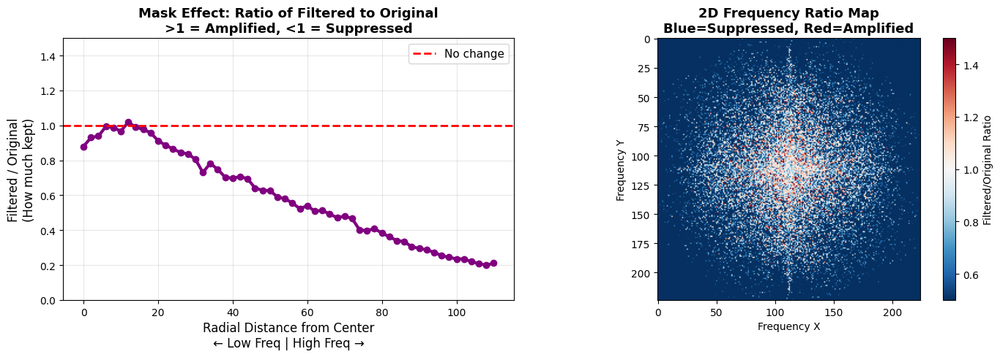


✓ This shows EXACTLY what the mask does:
  Ratio = 1.0: No change
  Ratio > 1.0: Amplified (ResNet wants this)
  Ratio < 1.0: Suppressed (ResNet doesn't need this)


In [32]:
"""
Cell 6: Better Visualization - Show Mask Impact as Ratio
"""

# Compute ratio instead of absolute values
ratio = mag_masked / (mag_original + 1e-8)  # Avoid division by zero

plt.figure(figsize=(14, 5))

# Plot 1: Mask effect as ratio
plt.subplot(1, 2, 1)
center = 112
radial_bins = np.arange(0, 112, 2)
radial_ratio = []

for r in radial_bins:
    y, x = np.ogrid[:224, :224]
    ring_mask = (np.sqrt((x-center)**2 + (y-center)**2) >= r) & \
                (np.sqrt((x-center)**2 + (y-center)**2) < r+2)
    if ring_mask.sum() > 0:
        radial_ratio.append(ratio[ring_mask].mean())
    else:
        radial_ratio.append(1.0)

plt.plot(radial_bins, radial_ratio, 'purple', linewidth=3, marker='o')
plt.axhline(y=1.0, color='red', linestyle='--', label='No change', linewidth=2)
plt.xlabel('Radial Distance from Center\n← Low Freq | High Freq →', fontsize=12)
plt.ylabel('Filtered / Original\n(How much kept)', fontsize=12)
plt.title('Mask Effect: Ratio of Filtered to Original\n>1 = Amplified, <1 = Suppressed', fontsize=13, fontweight='bold')
plt.grid(True, alpha=0.3)
plt.legend(fontsize=11)
plt.ylim([0, 1.5])

# Plot 2: 2D ratio visualization
plt.subplot(1, 2, 2)
im = plt.imshow(ratio, cmap='RdBu_r', vmin=0.5, vmax=1.5)
plt.colorbar(im, label='Filtered/Original Ratio')
plt.title('2D Frequency Ratio Map\nBlue=Suppressed, Red=Amplified', fontsize=13, fontweight='bold')
plt.xlabel('Frequency X')
plt.ylabel('Frequency Y')

plt.tight_layout()
plt.show()

print("\n✓ This shows EXACTLY what the mask does:")
print("  Ratio = 1.0: No change")
print("  Ratio > 1.0: Amplified (ResNet wants this)")
print("  Ratio < 1.0: Suppressed (ResNet doesn't need this)")

---

## Results Summary: ResNet-18 Frequency Preferences

### Key Findings

**Experiment 1 (Radial Mask)**: The learned 10-parameter radial mask revealed which distance ranges from the DC component (center of frequency spectrum) are most valuable for classification.

**Experiment 2 (Band Isolation)**: Diagnostic testing with hard frequency band masks identified which specific frequency ranges (LOW, MID-LOW, MID-HIGH, HIGH) are critical versus dispensable for ResNet-18's predictions.

**Experiment 3 (2D Mask)**: The high-resolution 50K parameter mask captured fine-grained spatial patterns in frequency preferences, potentially revealing directional biases or specific frequency combinations the model relies on.

### Implications

These experiments demonstrate that pre-trained convolutional networks develop distinct frequency preferences during training. Understanding these preferences can inform:
- Data augmentation strategies
- Adversarial robustness analysis
- Transfer learning decisions
- Architecture design choices
